# INFO7390 Advances in Data Science and Architecture, Spring 2022, Northeastern University

## Project: Skin Lesion Analysis towards Skin Cancer Detection

### Group 18: Sushmitha Jogula (NUID: 001546751), Chinmayi Narendra Shaligram (NUID: 001550682), and Dona Darji (NUID: 001044833 )

### Group Name: "Wonder Women"

## About the Project

In the United States, skin cancer is the most frequent type of cancer, with an annual cost of care exceeding $8 billion. The 5-year survival percentage of the most lethal form, melanoma, can be as high as 99 percent if detected early; but, if diagnosed late, the survival rate drops to only 23 percent.
Because early detection is so important, a lot of effort has gone into improving the accuracy and scope of diagnostic procedures. This is where skin lesion analysis comes into picture which can be employed for early cancer detection in patients and boost up the survival rate; skin cancer can be cured if it's found and treated early.

Skin cancers including melanoma, basal cell carcinoma, and squamous cell carcinoma often start as changes to your skin. They can be new growths or precancerous lesions i.e. areas of skin that look different from the surrounding area. They are often bumps or patches, and many issues can cause them. These are changes that are not cancer but could become cancer over time. An estimated 40% to 50% of fair-skinned people who live to be 65 will develop at least one skin cancer. Thus, it becomes highly critical to learn to spot the early warning signs. 

The main goal and motivation of our project is to build a model where we take various attributes of the patients along with the images of their skin lesions into consideration and predict the disease classification within the dermoscopic images. A model like this is very pertinent and provides a major breakthrough in the healthcare industry, and hence, we thought this would be the apt dataset to explore for our project and to understand various factors that can be used to identify the skin cancer class that a patient is affected from, while performing a comparative analysis of several ML models we employ here.

We ponder over patient attributes such as age, sex, skin lesion localization along with the image processing and classification analysis of the dermoscopic images, and estimate how these factors play a role in predicting the disease classification. We then train the model using the following Machine Learning and Deep Learning algorithms:

1. Softmax Regression
2. Support Vector Machines
3. Multi Layer Perceptron (MLP) and Convolutional Neural Network (CNN)
4. XGBoost

In this case, we use a Random Guess Classifer as a baseline method.

#### Google Colab Notebook Link: https://colab.research.google.com/drive/1mw92bIZB2TNZhSbWCdWbMeAvpcTVbTIv#scrollTo=Wi-_1_iGRKPG

### Importing the required libraries and initial setup

In [1]:
# Installing Kaggle
! pip install kaggle imbalanced-learn delayed --quiet

In [2]:
# Installing the Pandas Profiling library
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [3]:
! pip install pyyaml==5.4.1

In [4]:
# Importing the required libraries
import shutil
import os
from google.colab import files
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import seaborn as sns
import matplotlib.image as mpimg
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import pydot
import sklearn
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score, confusion_matrix, plot_precision_recall_curve, balanced_accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from PIL import Image, ImageOps
import pickle
import gc
from google.colab import drive
import numpy.linalg as linalg
import albumentations as augmntlib
from random import choice # for Random Classifier
from sklearn.linear_model import LogisticRegression # for Logistic Regression
import ast
from sklearn.svm import SVC # for SVM
import ast
import xgboost as xgb # for XGBoost
from pandas_profiling import ProfileReport # for pandas profile report
from matplotlib import rcParams

# Libraries for PCA
from sklearn.decomposition import PCA
import cv2

# Libraries for balancing dataset
from imblearn.pipeline import make_pipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

# Libraries for gridsearch
from sklearn.model_selection import ParameterGrid

# For hiding warnings
import warnings
warnings.filterwarnings('ignore')  # "error", "ignore", "always", "default", "module" or "once"

# For deep learning neural network
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import Callback 

# defining the image size global parameter
img_size = 40

pyo.init_notebook_mode()

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


A pickle can serialize objects so that they can be saved into a file and loaded again later for improving system performance and also eliminating storage issues.

Pickle can be used to serialize Python object structures, which refers to the process of converting an object in the memory to a byte stream that can be stored as a binary file on disk. When we load it back to a Python program, this binary file can be de-serialized back to a Python object.



In [5]:
# Defining method to save dataset images and files to a pickle in the form of a binary file (serialised)
def save_pickle(obj, filename, drive=True):
  path = ""
  if drive:
    path = "/gdrive/MyDrive/ADS/Project/Dataset"
    
  filehandler = open(f"{path}/{filename}.obj","wb")
  pickle.dump(obj, filehandler)
  filehandler.close()

In [6]:
# Defining method to load the dataset images and files from the pickle (deserialised, original format)
def open_pickle(filename, drive=True):
  if drive:
    path = "/gdrive/MyDrive/ADS/Project/Dataset"

  data = open(f"{path}/{filename}.obj",'rb')
  object_file = pickle.load(data)
  data.close()
  return object_file

In [7]:
# Defining method to load dataset directly from Kaggle via Kaggle API key call from CLI
def load_dataset(from_drive=True, balanced=False):
  if from_drive and not balanced:
    return open_pickle(filename="unbalanced_dataset_80_80", drive=True)
  if from_drive and balanced:
    return open_pickle(filename="balanced_dataset_80_80", drive=True)
  else:
    !rm -rf /content/HAM10000_images_part_1
    !rm -rf /content/HAM10000_images_part_2
    !rm -rf /content/ham10000_images_part_1
    !rm -rf /content/ham10000_images_part_2
    # Downloading dataset from Kaggle directly
    !kaggle datasets download -d kmader/skin-cancer-mnist-ham10000
    #Unzipping the downloaded dataset zip file
    !unzip -o skin-cancer-mnist-ham10000.zip
    # Moving files in a single directory from 2 directories
    source_dir = '/content/HAM10000_images_part_2'
    target_dir = '/content/HAM10000_images_part_1'
    # for extracting image file names in source_dir i.e. extracting source_dir contents
    file_names = os.listdir(source_dir) 
    # Moving all files to target_dir
    for file_name in file_names:
      shutil.move(os.path.join(source_dir, file_name), target_dir)

#### Loading the dataset and mounting the Google Drive to give access to the files in Google Drive to Colab notebook

In [8]:
# Mounting the Google Drive to a specific path to connect with Google Colab and save models and files
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

PATH = "../gdrive/MyDrive/ADS/Project/"

Mounted at /gdrive


Once we mount the Google Drive, we use the **kaggle.json** file to download the Kaggle dataset into the google drive and access that dataset from the Colab notebook. The steps to generate the API token are as follows:

1. Sign in to the Kaggle Account. If you don’t have a Kaggle account, first sign up.
2. Go to “Account”, go down the page, and find the “API” section.
3. Click the “Create New API Token” button.
4. The “kaggle.json” file will be downloaded. You’ll be also able to see a message “Ensure kaggle.json is in the location ~/.kaggle/kaggle.json to use the API” in a green background.

The “kaggle.json” file contains the Kaggle “username” and a “key”. We are attaching the kaggle.json file that can be used in our final submission.

In [9]:
# Uploading kaggle API key (kaggle.json) file to authenticate the API and easily download the Kaggle dataset with Python.
# We are attaching the kaggle.json file in the final submission
uploaded = files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [10]:
# Loading the dataset using Python directly after authenticating with Kaggle API
load_dataset(from_drive=False)

Streaming output truncated to the last 5000 lines.
  inflating: ham10000_images_part_2/ISIC_0029325.jpg  
  inflating: ham10000_images_part_2/ISIC_0029326.jpg  
  inflating: ham10000_images_part_2/ISIC_0029327.jpg  
  inflating: ham10000_images_part_2/ISIC_0029328.jpg  
  inflating: ham10000_images_part_2/ISIC_0029329.jpg  
  inflating: ham10000_images_part_2/ISIC_0029330.jpg  
  inflating: ham10000_images_part_2/ISIC_0029331.jpg  
  inflating: ham10000_images_part_2/ISIC_0029332.jpg  
  inflating: ham10000_images_part_2/ISIC_0029333.jpg  
  inflating: ham10000_images_part_2/ISIC_0029334.jpg  
  inflating: ham10000_images_part_2/ISIC_0029335.jpg  
  inflating: ham10000_images_part_2/ISIC_0029336.jpg  
  inflating: ham10000_images_part_2/ISIC_0029337.jpg  
  inflating: ham10000_images_part_2/ISIC_0029338.jpg  
  inflating: ham10000_images_part_2/ISIC_0029339.jpg  
  inflating: ham10000_images_part_2/ISIC_0029340.jpg  
  inflating: ham10000_images_part_2/ISIC_0029341.jpg  
  inflating: h

#### Show the loaded data

The files given by HAM10000 dataset are:

1. metadata file which contains all patient attribute related with disease and the target column i.e. dx
2. skin lesion images

### Dataset Description

The small size and lack of diversity of the available datasets of dermatoscopic images make it difficult to train neural networks for automated diagnosis of pigmented skin lesions. The HAM10000 Dataset is used to tackle this problem. The dermatoscopic images from different populations are acquired from all anatomic sites (excluding mucosa and nails) and stored by different modalities. The final dataset consists of 10015 dermatoscopic images which can serve as a training set. The dataset includes lesions with multiple images, which can be tracked by the lesionid column within the HAM10000_metadata file.

The diagnostic lesion categories included in our analysis are:
1. Actinic keratoses and intraepithelial carcinoma / Bowen's disease (akiec) 
2. Basal cell carcinoma (bcc)
3. Benign keratosis-like lesions (solar lentigines / seborrheic keratoses and lichen-planus like keratoses, bkl)
4. Dermatofibroma (df)
5. Melanoma (mel)
6. Melanocytic nevi (nv) 
7. Vascular lesions (angiomas, angiokeratomas, pyogenic granulomas and hemorrhage, vasc)

More than 50% of lesions are confirmed through histopathology (histo), the ground truth for the rest of the cases is either follow-up examination (followup), expert consensus (consensus), or confirmation by in-vivo confocal microscopy (confocal).

The HAM10000 dataset can be found on Kaggle here: **https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000?select=HAM10000_metadata.csv**

In [11]:
# Loading patient information metadata into a dataframe including:
# 1. image
# 2. dx i.e. lesion type
# 3. dx_type i.e. how the lesion is detected and confirmed
# 4. age of patient 
# 5. sex of patient
# 6. location of the lesion
ham10000dataset_metadata = pd.read_csv(f"./HAM10000_metadata.csv")
ham10000dataset_metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


#### About the patient metadata dataframe

In [12]:
# Dataframe information
ham10000dataset_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


In [13]:
# Dataframe description
ham10000dataset_metadata.describe()

,age
count,9958.000000
mean,51.863828
std,16.968614
min,0.000000
25%,40.000000
50%,50.000000
75%,65.000000
max,85.000000


In [14]:
# shape and data types of the data
print('Shape and Data Types of dataset:')
print(ham10000dataset_metadata.shape)
print(ham10000dataset_metadata.dtypes)

# numeric columns
ham10000dataset_metadata_numeric = ham10000dataset_metadata.select_dtypes(include=[np.number])
numeric_cols = ham10000dataset_metadata_numeric.columns.values
print('\n Numeric columns of dataset:')
print(numeric_cols)

# non numeric columns
ham10000dataset_metadata_non_numeric = ham10000dataset_metadata.select_dtypes(exclude=[np.number])
non_numeric_cols = ham10000dataset_metadata_non_numeric.columns.values
print('\n Non-Numeric columns of dataset:')
print(non_numeric_cols)

Shape and Data Types of dataset:
(10015, 7)
lesion_id        object
image_id         object
dx               object
dx_type          object
age             float64
sex              object
localization     object
dtype: object

 Numeric columns of dataset:
['age']

 Non-Numeric columns of dataset:
['lesion_id' 'image_id' 'dx' 'dx_type' 'sex' 'localization']


#### Pandas Profiling Report

Pandas Profiling is an open source Python module with which we can quickly do an exploratory data analysis of our dataset. It generates a report with information including visualizing and understanding the distribution of each variable in our dataset. 

In [15]:
# The Pandas Profile Report is run and the report is generated. 

profile = ProfileReport(ham10000dataset_metadata, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
# Saving the file
# We will attach the profile report file in the final submission.
profile.to_file(output_file = 'Pandas_Profiling_Report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Visualizing Missing Values of the dataset

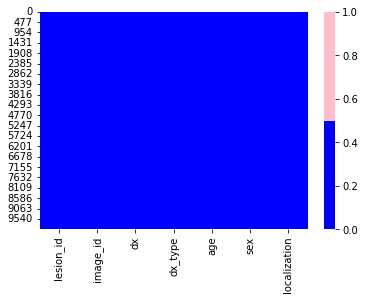

In [17]:
#a) Using Heatmap
%matplotlib inline
cols = ham10000dataset_metadata.columns[:] 
colours = ['blue', 'pink'] #blue indicates not missing, pink indicates missing values
sns.heatmap(ham10000dataset_metadata[cols].isnull(), cmap=sns.color_palette(colours))

In [18]:
#b) Calculating percentage of missing values in the dataset columns
for col in ham10000dataset_metadata.columns:
    pct_missing = np.mean(ham10000dataset_metadata[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

lesion_id - 0%
image_id - 0%
dx - 0%
dx_type - 0%
age - 1%
sex - 0%
localization - 0%


##### Using Missingno Library

Missingno is a python library that provides a series of visualisations to understand the presence and distribution of missing data within a pandas dataframe. This can be in the form of either a barplot, matrix plot, heatmap, or a dendrogram.

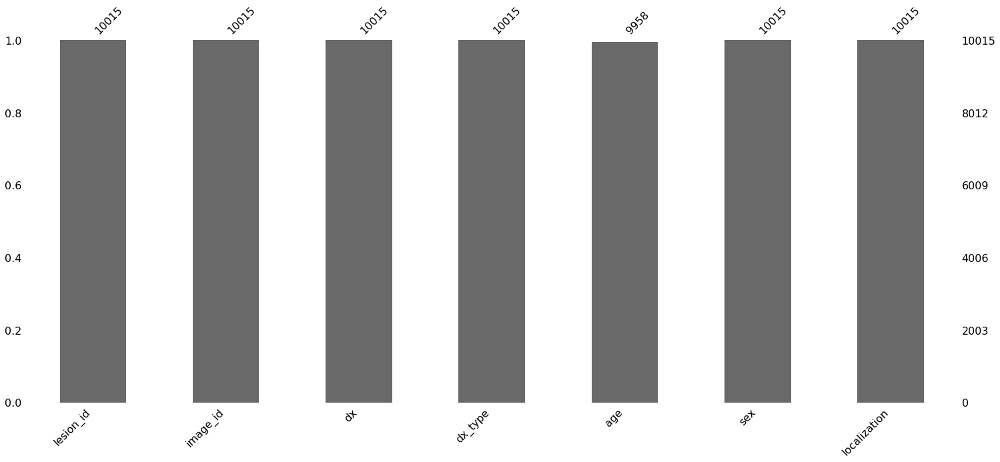

In [19]:
import missingno as msno

#bar chart of missing values
msno.bar(ham10000dataset_metadata)

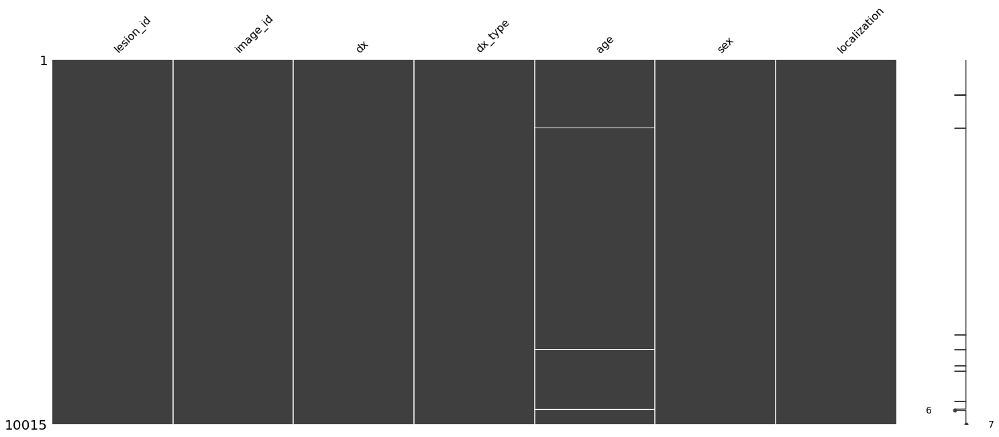

In [20]:
#Matrix plot of missing values
msno.matrix(ham10000dataset_metadata)

In [21]:
# Creating a new dictionary to store the lesion types
lesion_type_dict = {
    'nv': 'Melanocytic nevi (nv)',
    'mel': 'Melanoma (mel)',
    'bkl': 'Benign keratosis-like lesions (bkl)',
    'bcc': 'Basal cell carcinoma (bcc)',
    'akiec': 'Actinic keratoses (akiec)',
    'vasc': 'Vascular lesions (vasc)',
    'df': 'Dermatofibroma (df)'
}

### Exploratory Data Analysis

#### Patient Data Distribution

Text(0.5, 1.0, 'Localization Distribution')

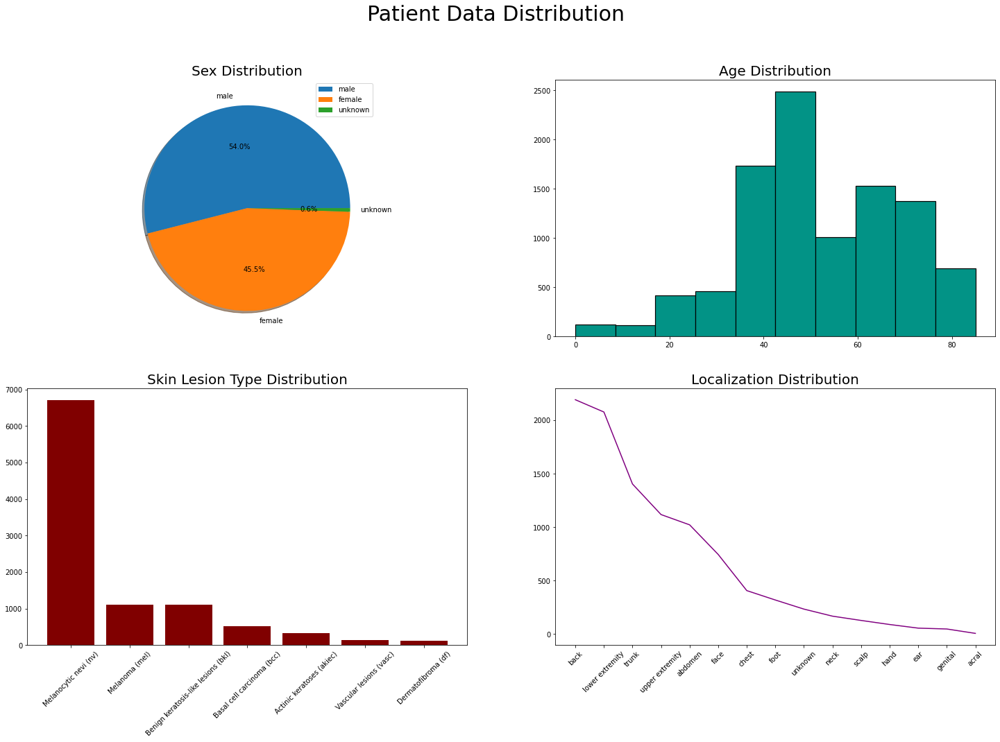

In [22]:
# Creating plots to visualize the loaded dataset metadata and patient attribute information
%matplotlib inline
fig=plt.figure(figsize=(25, 15))
fig.suptitle('Patient Data Distribution', fontsize = 30)
# Sub-plot for Patient Sex
plt.subplot(2,2,1)
plt.pie(ham10000dataset_metadata['sex'].value_counts(), 
            labels = ham10000dataset_metadata['sex'].value_counts().index, autopct='%1.1f%%', shadow=True)
        #wedgeprops = {"edgecolor" : "black",
                #      'linewidth': 2,
                  #    'antialiased': True})
plt.legend(loc="upper right")
plt.title('Sex Distribution', fontsize = 20)
# Sub-plot for Patient Age
plt.subplot(2,2,2)
plt.hist(ham10000dataset_metadata['age'], color ='#029386', edgecolor='black', linewidth=1.2)
#plt.legend(loc="upper right")
plt.title('Age Distribution', fontsize = 20)
# Sub-plot for Patient Skin Lesion Type
plt.subplot(2,2,3)
plt.bar(ham10000dataset_metadata['dx'].value_counts().index.map(lesion_type_dict.get), 
            ham10000dataset_metadata['dx'].value_counts(), color ='maroon')
plt.xticks(rotation=45)
#plt.legend(loc="upper right")
plt.title('Skin Lesion Type Distribution', fontsize = 20)
# Sub-plot for Lesion Type Localization
plt.subplot(2,2,4)
plt.plot(ham10000dataset_metadata['localization'].value_counts().index, 
            ham10000dataset_metadata['localization'].value_counts(), color ='purple',
        )
plt.xticks(rotation=45)
#plt.legend(loc="upper right")
plt.title('Localization Distribution', fontsize = 20)

#### Patient Lesion Detection/Confirmation across Lesion Types

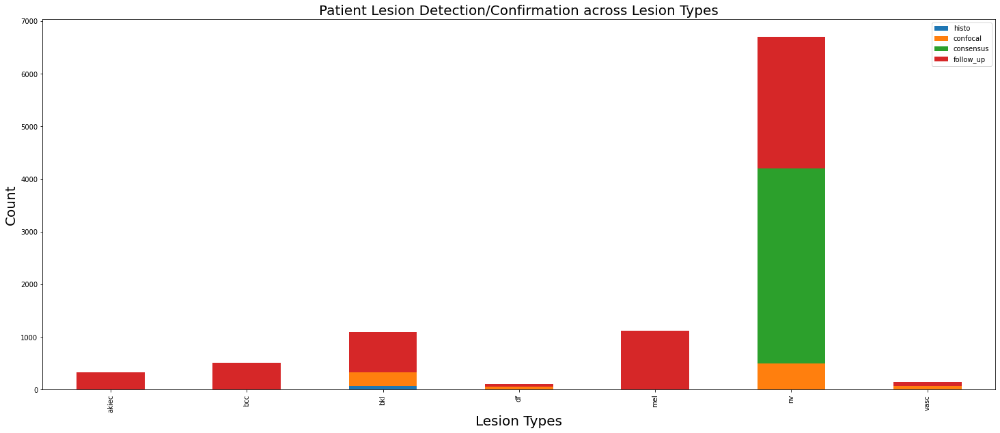

In [23]:
%matplotlib inline
temp = ham10000dataset_metadata[['dx', 'dx_type']].groupby(['dx', 'dx_type']).size().reset_index()
ax = temp.set_index(['dx', 'dx_type']).unstack(level=1).plot(kind='bar', stacked=True, figsize=(25, 10))
ax.set_title('Patient Lesion Detection/Confirmation across Lesion Types', fontsize=20)
ax.set_xlabel('Lesion Types', fontsize=20)
ax.set_ylabel('Count', fontsize=20)
ax.legend(temp['dx_type'].unique())
plt.show()

#### Correlation between features

In [24]:
patient_data = ham10000dataset_metadata
def Encode(patient_data):
    for column in patient_data.columns:
        patient_data[column] = patient_data[column].factorize()[0]
    return patient_data

patient_data_encode = Encode(patient_data.copy())

In [25]:
#viewing the correlation matrix
patient_data_encode.corr()

,lesion_id,image_id,dx,dx_type,age,sex,localization
lesion_id,1.000000,0.995187,-0.060723,-0.029298,0.288034,0.045401,0.090923
image_id,0.995187,1.000000,-0.015512,-0.045430,0.277850,0.046365,0.089138
dx,-0.060723,-0.015512,1.000000,-0.329016,-0.204502,-0.074302,-0.082775
dx_type,-0.029298,-0.045430,-0.329016,1.000000,0.118948,0.039618,0.113648
age,0.288034,0.277850,-0.204502,0.118948,1.000000,0.132565,0.092391
sex,0.045401,0.046365,-0.074302,0.039618,0.132565,1.000000,0.116552
localization,0.090923,0.089138,-0.082775,0.113648,0.092391,0.116552,1.000000


##### Correlation Matrix 

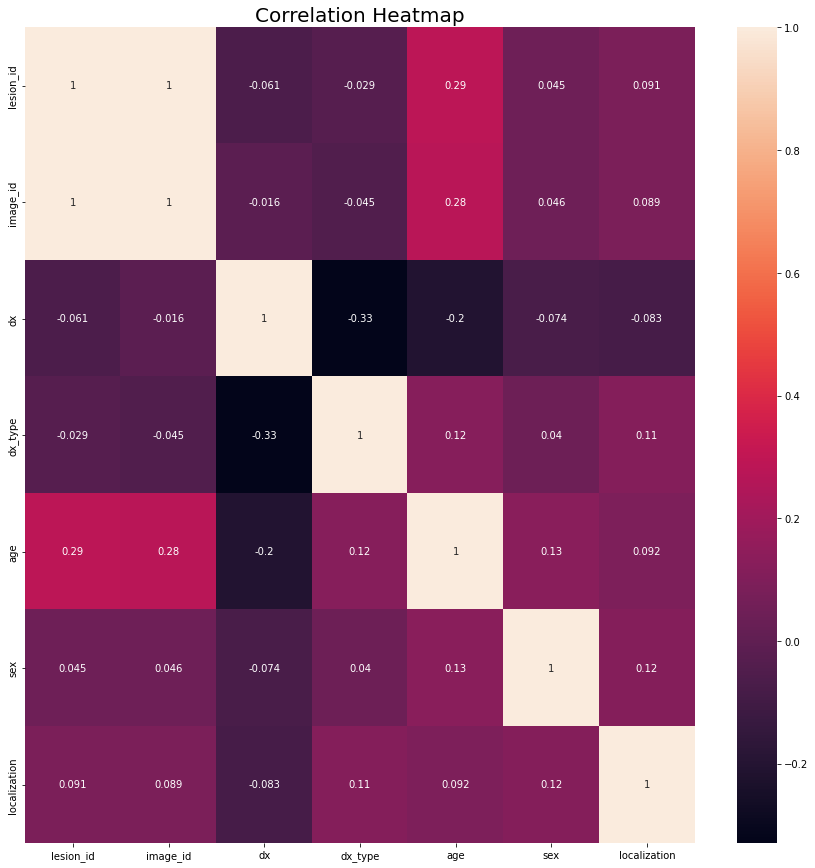

In [26]:
rcParams['figure.figsize'] = (15,15)
sns.heatmap(patient_data_encode.corr(), annot=True)
plt.title('Correlation Heatmap', size = 20)
plt.show()

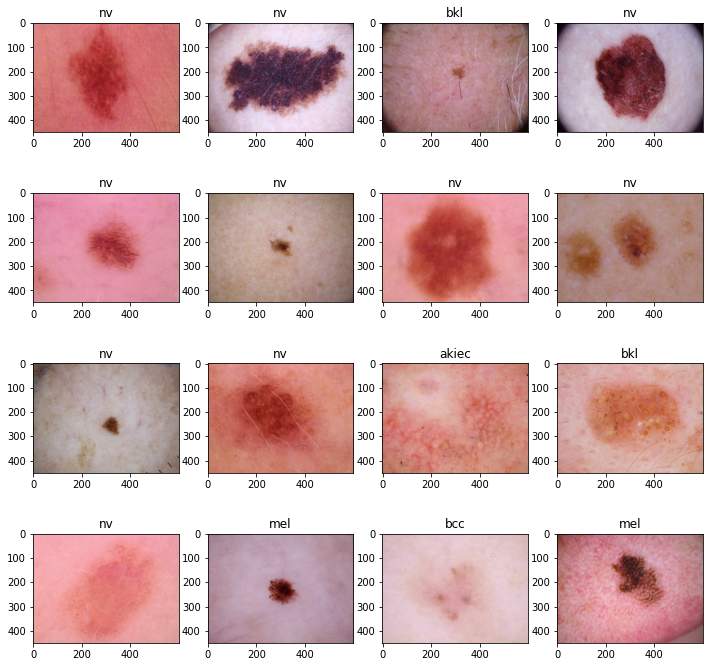

In [27]:
# Creating a new method to display images loaded from the HAM10000dataset

def show_images(imgs, path=""):
  _, axs = plt.subplots(4, 4, figsize=(12, 12))
  axs = axs.flatten() # returns a flattened version of the array
  for img, ax in zip(imgs, axs):
    # read images from the input dataset files into an array
    image = mpimg.imread(f"{path}/{img}")
    # setting image title as image's lesion type respectively to categorise the data easily
    ax.set_title(ham10000dataset_metadata[ham10000dataset_metadata["image_id"]==img.split(".")[0]].values[0][2]) 
    # displaying the array as an image
    ax.imshow(image)
  plt.show()

show_images(os.listdir("/content/HAM10000_images_part_1/")[0:60], path="/content/HAM10000_images_part_1/")

### Principal Component Analysis (PCA)

Principal Component Analysis (PCA) is a dimensionality-reduction method that is often used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set, because smaller data sets are easier to explore and visualize and make analyzing data much easier and faster for machine learning algorithms without extraneous variables to process. In a real-time scenario when you are working reducing the number of variables in the dataset you need compromise on model accuracy but using PCA will give good accuracy. The idea of PCA is to reduce the number of variables of a data set, while preserving as much information as possible.

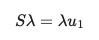

where S is the dataset covariance matrix, u1 is unitary vector and lambda is the lagrangian coefficient. The best u1 solution is then the eigenvector associated to the maximum eigenvalue of the cov matrix .

In [28]:
# Creating a new method for PCA Analysis
def pca(M,vec,numpc=0):
    # extracting eigenvectors corresponding to the first numpc eigenvalues
    eigenvectors = vec[:,range(numpc)]
    # creating projection of the data in the new space of dimension numpc
    projections = np.dot(M,eigenvectors) 
    # returning eigenvectors and projections
    return eigenvectors, projections

In [29]:
# Creating a new method for computing eigenvalues and eigenvectors of the covariance matrix of the set of vectors corresponding to rows of input A
def get_eigen(A):
    # computing mean for each feature column
    feature_column_means = np.mean(A,axis=0)
    # subtracting the mean (along columns) so that each feature has now zero mean
    M = (A-feature_column_means)
    # deriving the covariance matrix of the set of vectors corresponding to rows of A
    c = np.cov(M, rowvar=0)
    # compute the sets of eigenvalues and eigenvectors of the covariance matrix
    [eigenvals,eigenvects] = np.linalg.eig(c)
    # compute indices of eigenvalues sorted in descending order
    eigenvals_index = np.argsort(eigenvals) 
    # derive indices of eigenvalues sorted in ascending order
    eigenvals_index = eigenvals_index[::-1]       

    # sort eigenvectors (columns of evects) according to the sorted eigenvalues
    eigenvects = eigenvects[:,eigenvals_index]
    # sort eigenvalues in ascending order
    eigenvals = eigenvals[eigenvals_index] 
    return eigenvals, eigenvects, M

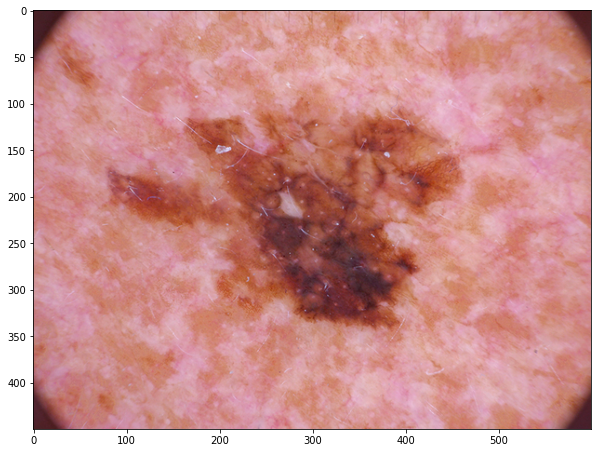

In [30]:
# Loading an image to compute its eigenvalue, eigenvectors, covariance matrix
image = plt.imread('/content/HAM10000_images_part_1/ISIC_0024310.jpg') 
plt.figure(figsize = (10,10))
plt.imshow(image)

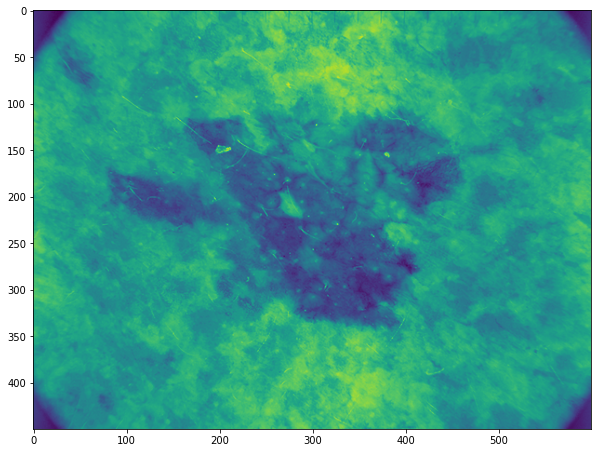

In [31]:
mn = np.mean(image,2)
full_pc = mn.shape[0]
eigenval, eigenvec, mn_cov = get_eigen(mn)
# Displaying the Covariance matric of eigen vectors 
plt.rcParams["axes.grid"] = False
plt.figure(figsize = (10,10))
plt.imshow(mn_cov)

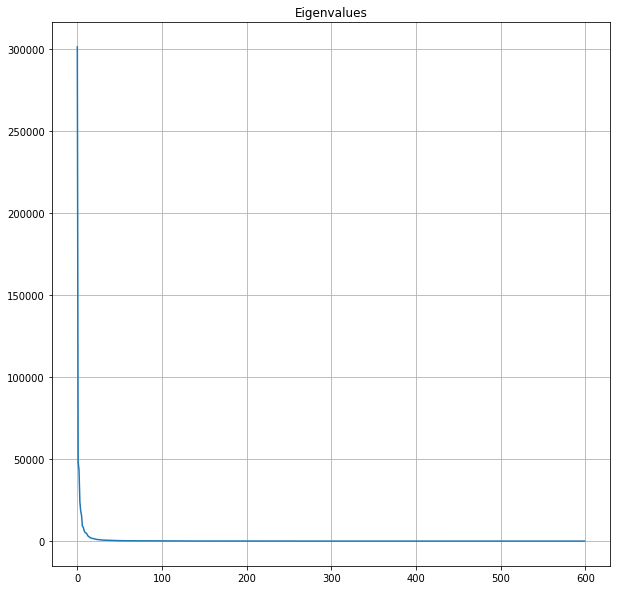

In [32]:
# Plotting the eigenvalues of the image
#print('Eigenvalues of image:')
#print(eigenval)
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
ax.plot(eigenval)
ax.grid()
plt.title('Eigenvalues')
plt.show()

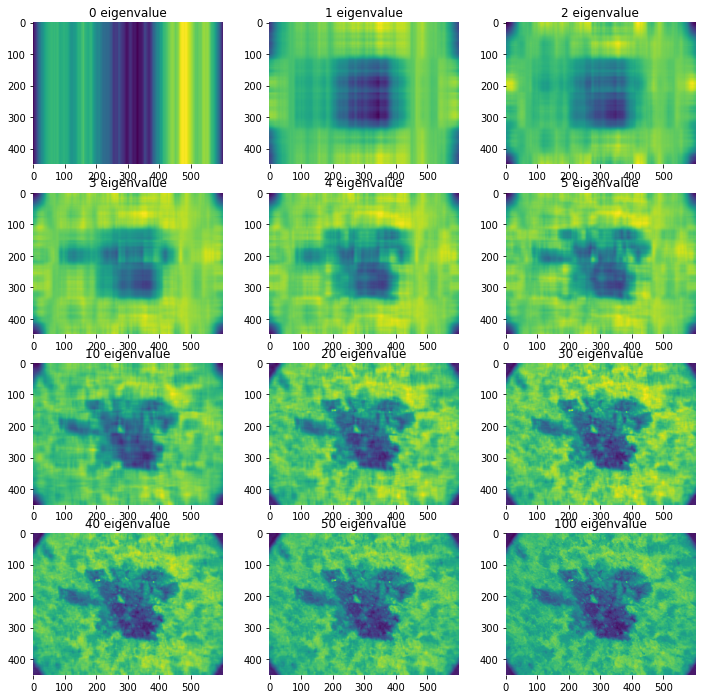

In [33]:
# Displaying the eigenvalues of the image
i = 1
fig = plt.figure(figsize=(12,12))
for numpc in [0,1,2,3,4,5]+list(range(10,51,10))+[100]: 
    # computing projections on a space of dimension numpc
    coeff, score = pca(mn_cov,eigenvec,numpc)
    # compute projections back into a space of original dimension
    mn_rec = np.dot(score,coeff.T) 
    # adding back feature means
    mn_rec = mn_rec + np.mean(mn,axis=0) 
    # difference in Frobenius norm between original and compressed images and plot image
    ax = plt.subplot(4,3,i,frame_on = False)
    i += 1 
    plt.imshow(np.asarray(mn_rec, dtype=np.float32))
    plt.title(str(numpc) + ' '+'eigenvalue')

Text(0.5, 1.0, 'Resized/Antialiased')

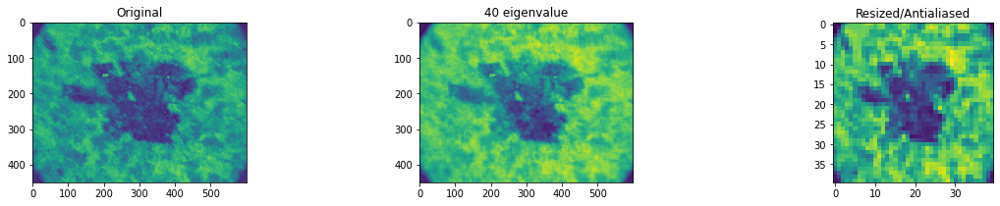

In [34]:
# Loading an image 
image =plt.imread('/content/HAM10000_images_part_1/ISIC_0024310.jpg') 

mn = np.mean(image,2)
full_pc = mn.shape[0]
eigenval,eigenvec,mn_cov=get_eigen(mn)
plt.rcParams["figure.figsize"] = (20,3)
numpc = 40
# computing projections on a space of dimension numpc
coeff, score = pca(mn_cov, eigenvec, numpc)
# computing projections back into a space of original dimension
mn_rec = np.dot(score,coeff.T) 
# adding back feature means
mn_rec = mn_rec+np.mean(mn,axis=0)
# difference in Frobenius norm between original and compressed image and plot image
fig, (ax1,ax2, ax3) = plt.subplots(1, 3)

# Displaying the original image
ax1.imshow(plt.imread('/content/HAM10000_images_part_1/ISIC_0024310.jpg')[:, :, -1])
ax1.set_title("Original")

# Displaying the image eigenvalue 
ax2.imshow(np.asarray(mn_rec, dtype=np.float32))
ax2.set_title(str(numpc) + ' '+'eigenvalue')

# Displaying the resized i.e. antialiased image
image = Image.open('/content/HAM10000_images_part_1/ISIC_0024310.jpg')
image = image.resize((img_size, img_size), Image.ANTIALIAS)
image = np.array(image)
ax3.imshow(image[:,:,-1])
ax3.set_title("Resized/Antialiased")

### Data Analysis

In this section, we discuss about the distribution of the dataset with respect to the target column dx, and we analyze the structure of the images. Our main goal is to understand the dataset distribution and composition in order to manipulate the data in the right way. We investigate about target class distribution and image properties such as image sizes, channels, and pixel distributions.

#### Target Class Distribution

The target class/column in this case is "dx". This column contains the skin cancer disease type. 

Total number of input images= 10015
Target Class Distribution Dataframe
  target  count
0     nv   6705
1    mel   1113
2    bkl   1099
3    bcc    514
4  akiec    327
5   vasc    142
6     df    115


Text(0.5, 1.0, 'Target Class Distribution')

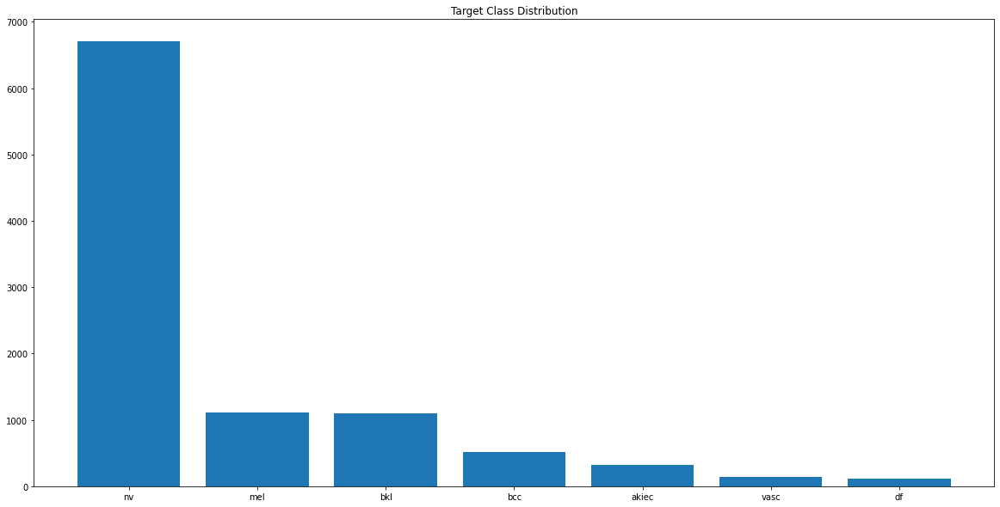

In [35]:
# For target class distribution
target_class_dist = dict(ham10000dataset_metadata["dx"].value_counts())

# Creating target class distribution dataframe
target_class_dist_df = pd.DataFrame({"target":list(target_class_dist.keys()), "count":list(target_class_dist.values())})

# For total number of input images
total_examples = np.sum(target_class_dist_df["count"].values)

print('Total number of input images=',total_examples)
print('Target Class Distribution Dataframe')
print(target_class_dist_df)

# plot distribution
%matplotlib inline
plt.figure(figsize = (20,10))
plt.bar(target_class_dist_df["target"], target_class_dist_df["count"])
plt.title("Target Class Distribution")


In [36]:
# Adding new column percentage to target_class_dist_df to get percentage of each target class
target_class_dist_df["percentage"] = (target_class_dist_df["count"] * 100) / total_examples
target_class_dist_df

,target,count,percentage
0,nv,6705,66.949576
1,mel,1113,11.113330
2,bkl,1099,10.973540
3,bcc,514,5.132302
4,akiec,327,3.265102
5,vasc,142,1.417873
6,df,115,1.148278


The distribution of the "dx" column shows the imbalance derived from the first class, the number of examples of "nv" class is about 5 times greater then the second class "mel" with more examples.

Some of the basic properties of images to be considered in Image Processing are:
1. Image Sizes
2. Channels 
3. Pixel Distributions

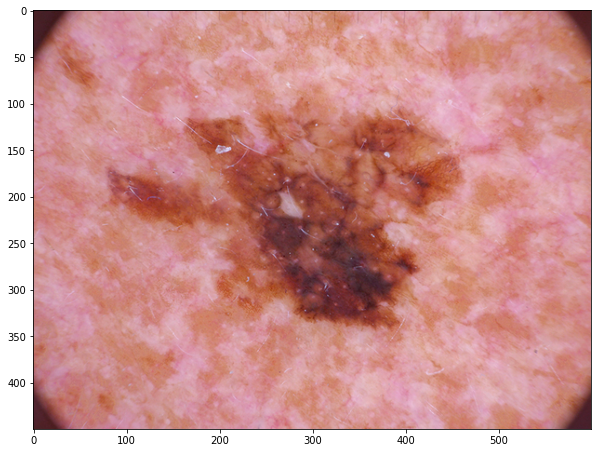

In [37]:
# Loading an image to display its properties
image = mpimg.imread("/content/HAM10000_images_part_1/ISIC_0024310.jpg")
plt.figure(figsize = (10,10))
plt.imshow(image)

In addition to showing an image, we can provide a number of properties  that can be used with images. Some of the key properties include:

1. filename: The name of the image file
2. Type: The image class type 
3. Shape: The image shape
4. size: The image size in pixels displayed as a width, height tuple
5. width: The width of the image in pixels
6. height: The height of the image in pixels

In [38]:
# Printing the properties of the loaded image
print("Image Properties:")
print(f'Type of the image : {type(image)}') 
print(f'Shape of the image : {image.shape}') 
print(f'Image Height : {image.shape[0]}') 
print(f'Image Width : {image.shape[1]}') 
print(f'Dimension of Image : {image.ndim}')

Image Properties:
Type of the image : <class 'numpy.ndarray'>
Shape of the image : (450, 600, 3)
Image Height : 450
Image Width : 600
Dimension of Image : 3


**Image Colour Channels**: The R,G,B colour additive model is considered here. A typical color image consists of three color channels: red, green and blue. Each color channel has 8 bits and can represent 256 distinct values. Using a combination of all three channels, we can create 256 x 256 x 256 colors, which is around 16-million colors.

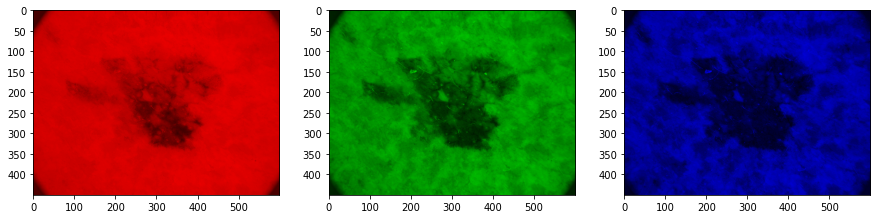

In [39]:
# Displaying the loaded image in three color channels i.e. R,G,B channels
fig, ax = plt.subplots(nrows = 1, ncols=3, figsize=(15,15))  
for c, ax in zip(range(3), ax):     
     # create zero matrix        
     split_image = np.zeros(image.shape, dtype="uint8")  
     # displaying each channel  
     # image[:, :, 0] means get all rows, all columns, and the first (at index 0) color channel, which is the red channel. 
     # Similarly, image[:,:,1] is the green channel, and image[:,:,2] is the blue channel
     split_image[ :, :, c] = image[ :, :, c]   
     ax.imshow(split_image)

**Distribution of Pixels**

Images are stored as rectangular arrays of hundreds, thousands, or millions of discrete “picture elements,” otherwise known as pixels. Each pixel can be thought of as a single square point of colored light. In simple words, images are stored as pixels values, each pixel value represents a color intensity value. In an image processing context, the histogram of an image normally refers to a histogram of the pixel intensity values. This histogram is a graph showing the number of pixels in an image at each different intensity value found in that image. 

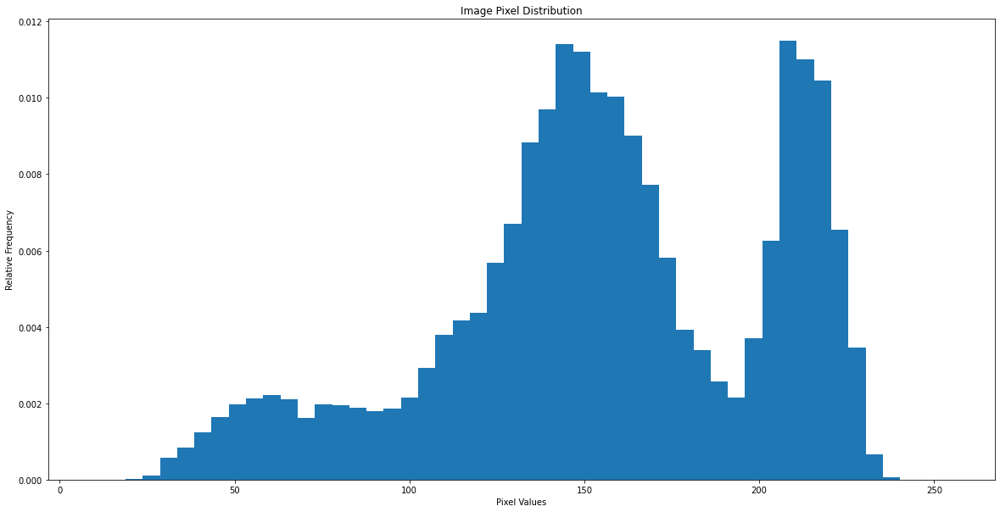

In [40]:
# Plotting Pixel Distibution of the loaded image
plt.figure(figsize = (20,10))
plt.hist(np.array(image).ravel(), bins=50, density=True);
plt.xlabel("Pixel Values")
plt.ylabel("Relative Frequency")
plt.title("Image Pixel Distribution");

#### Labels Encoding

For the skin lesion classification task, we are encoding the labels of target column "dx". We use a string to integer mapping for each disease target.

In [41]:
skin_lesion_type_classes = list(ham10000dataset_metadata["dx"].unique())
# label encoding of skin lesion type
def labels_to_integer(row):
  return skin_lesion_type_classes.index(row)
print('Skin Lesion Type Classes:',skin_lesion_type_classes)

Skin Lesion Type Classes: ['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec']


In [42]:
# Adding the new encoded label to transform skin lesion type i.e. dx to integer
ham10000dataset_metadata["dx_label"] = ham10000dataset_metadata["dx"].apply(labels_to_integer) 
ham10000dataset_metadata

,lesion_id,image_id,dx,dx_type,age,sex,localization,dx_label
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,0
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,0
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,0
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,0
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,0
...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen,6
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen,6
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen,6
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face,6


### Feature Engineering

Feature engineering efforts mainly have two goals:

* Preparing the proper input dataset, compatible with the machine learning 
algorithm requirements.
* Improving the performance of machine learning models.

In this step we try to avoid the problems derived from the imbalanced dataset distribution. Expecially in our case study there is a strong target class imbalance.

Resizing is the most fundamental transformation done in deep learning. The primary reason for doing this is to ensure that the input received by our deep learning system is consistent.
Another reason for resizing is to reduce the number of parameters in the model. Smaller dimensions signify a smaller neural network and hence, saves us the time and computation power required to train our model.

In [43]:
# Creating a new method for loading dataset images and retrieving target labels
def load_images(root_dir, size=80):
  X, Y = [], []
  for img in tqdm(os.listdir(root_dir)):
    # loading the image from the directory
    image = Image.open(f"{root_dir}/{img}")
    # creating a resized/antialiased image from the original image
    image = image.resize((img_size, img_size), Image.ANTIALIAS)
    # converting the image to an array
    image = np.array(image)
    # retrieving the target class labels 
    target = ham10000dataset_metadata[ham10000dataset_metadata["image_id"]==img.split(".")[0]]["dx_label"].values[0]
    # append resized images to X
    X.append(image)
    # append target class labels to Y
    Y.append(target)
  return np.array(X), np.array(Y)

X, Y = load_images("/content/HAM10000_images_part_1", size=img_size)

print('Shape of X:',X.shape)
print('Shape of Y:',Y.shape)
print('X:')
print(X)
print('Y:')
print(Y)

100%|██████████| 10015/10015 [02:55<00:00, 56.95it/s]


Shape of X: (10015, 40, 40, 3)
Shape of Y: (10015,)
X:
[[[[217 130 131]
   [219 130 129]
   [220 130 131]
   ...
   [212 122 122]
   [210 121 123]
   [208 120 120]]

  [[218 131 135]
   [218 129 129]
   [217 126 130]
   ...
   [208 116 116]
   [207 119 117]
   [209 122 121]]

  [[220 137 139]
   [217 130 132]
   [216 127 127]
   ...
   [207 114 113]
   [205 113 109]
   [208 119 116]]

  ...

  [[197 105 102]
   [196 104 103]
   [201 112 109]
   ...
   [199 114 105]
   [196 116 107]
   [192 108  97]]

  [[198 108 106]
   [198 109 109]
   [199 108 106]
   ...
   [200 121 112]
   [195 112 102]
   [194 111 101]]

  [[197 108 105]
   [199 110 109]
   [196 103 101]
   ...
   [200 120 111]
   [195 114 103]
   [194 114 104]]]


 [[[ 57  46  63]
   [114 107 121]
   [167 166 176]
   ...
   [193 161 172]
   [158 127 139]
   [106  78  93]]

  [[ 86  74  91]
   [141 136 146]
   [171 162 173]
   ...
   [199 172 182]
   [183 159 172]
   [142 115 128]]

  [[117 107 119]
   [154 141 152]
   [134  94 10

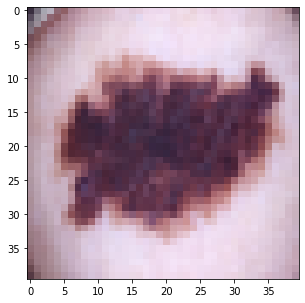

In [44]:
plt.figure(figsize = (5,5))
plt.imshow(X[1])

### Splitting Train and Test Data

In this section, we split the data that we use in our experiments. The dataset contains more than 10.000 images.

We choose a 70/30 train-test splitting, we also split train example in train and validation set using a 90/10 split. Moreover, we decide to use a shuffle strategy at data loading time.

In [45]:
# Defining Hyperparameters
test_size_value = 0.3 # 70/30 split for train and test data
val_size = 0.1 # 90/10 split for train and validation data

In [46]:
# Splitting Train and Test Data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size_value, shuffle=True)
# Splitting Train and Validation Data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=val_size, shuffle=True)

In [47]:
# Pickle is used to save experiments data to save memory space
# Saving train data to pickle 
save_pickle((X_train.reshape(-1, img_size, img_size, 3),Y_train), "train_data") # X_train resized to reduced to 2-dim
# Saving validation data to pickle
save_pickle((X_val,Y_val), "val_data") 
# Saving test data to pickle
save_pickle((X_test,Y_test), "test_data")

In [48]:
# Loading the train data, test data, and validation data from pickle
X_train, Y_train = open_pickle("train_data")
X_test, Y_test = open_pickle("test_data")
X_val, Y_val = open_pickle("val_data")

### Data Balancing

The HAM10000 image dataset is an **imbalanced dataset.** If there is the very high different between the positive values and negative values, then we can say our dataset is imbalanced. In general, an imbalanced dataset has an unequal distribution of classes within itself. Imbalanced datasets are those where there is a severe skew in the class distribution, such as 1:100 or 1:1000 examples in the minority class to the majority class.

This bias in the training dataset can influence many machine learning algorithms, leading some to ignore the minority class entirely. This is a problem as it is typically the minority class on which predictions are most important. This bias leads to following problems:

* Good performances on a specific class (the class with most examples in the dataset)
* Bad performances in other classes
* No generalization

One approach to addressing the problem of class imbalance is to randomly resample the training dataset. The two main approaches to randomly resampling an imbalanced dataset are to delete examples from the majority class, called undersampling, and to duplicate examples from the minority class, called oversampling.

#### Random Resampling

Random resampling provides a naive technique for rebalancing the class distribution for an imbalanced dataset. Resampling involves choosing examples for the transformed dataset randomly and creating a new transformed version of the training dataset in which the selected examples have a different class distribution.

There are two main approaches to random resampling for imbalanced classification; they are oversampling and undersampling.
* **Undersampling** is the process where you randomly delete some of the observations from the majority class in order to match the numbers with the minority class.
* **Oversampling** process is a little more complicated than undersampling. It is the process of generating synthetic data that tries to randomly generate a sample of the attributes from observations in the minority class. 

In this case, we use both Oversampling and Undersampling with a specific pipeline:
RandomUnderSampler (Undersampling): decreasing to K the number of examples of the class with more examples (CLASS 1).
RandomOverSampling (Oversampling): increase to K the number of small classes.

**Random oversampling** randomly duplicates examples from the minority class in the training dataset and can result in overfitting for some models.

**Random undersampling** randomly deletes examples from the majority class and can result in losing information invaluable to a model. 

In [49]:
# Creating a new method for resampling

def generate_resampling(X, Y, undersampling=True, oversampling=True, K=2500):
  # oversampling and undersampling
  if undersampling and oversampling:
    sampler = make_pipeline(
        RandomUnderSampler(random_state=0, sampling_strategy={1: K}),
        RandomOverSampler(random_state=0)
    )
  # undersampling only
  if undersampling and not oversampling:
    sampler = make_pipeline(
    RandomUnderSampler(random_state=0, sampling_strategy={1: K}))

  X_resampled, Y_resampled = sampler.fit_resample(X.reshape(-1, img_size*img_size*3), Y)

  return X_resampled, Y_resampled

# Generating undersampled data and saving to pickle
X_balanced, Y_balanced = generate_resampling(X_train, Y_train, undersampling=True, oversampling=False, K=2500)
save_pickle((X_balanced.reshape(-1, img_size, img_size, 3),Y_balanced), "undersampled_train_data")

# Generating combined resampled data and saving to pickle
X_balanced, Y_balanced = generate_resampling(X_train, Y_train)
save_pickle((X_balanced.reshape(-1, img_size, img_size, 3),Y_balanced), "combined_train_data")

Text(0.5, 1.0, 'Target Class Distribution after random resampling')

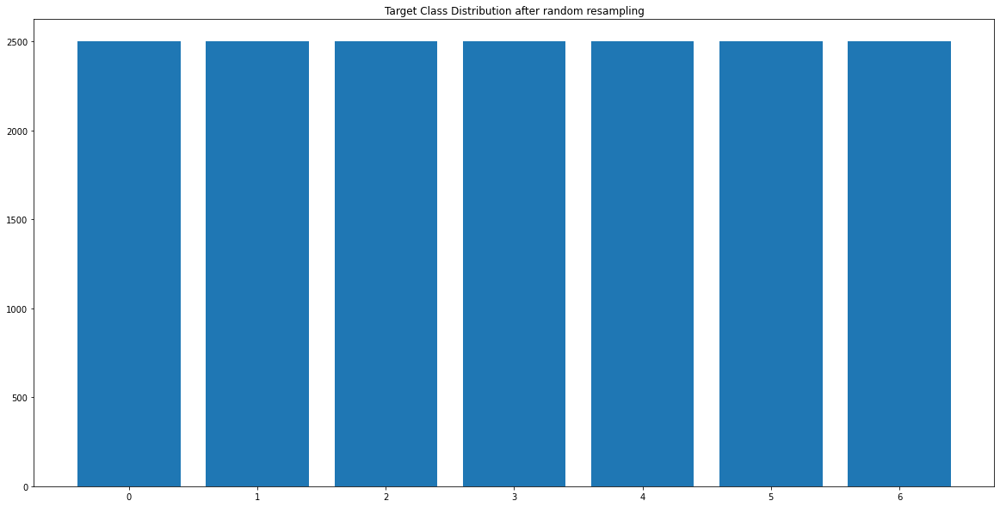

In [50]:
# Loading the randomly resampled combined data from pickle
X_resampled, Y_resampled = open_pickle("combined_train_data")
counts = Counter(Y_resampled)
# Creating target distribution dataframe  
target_dist_df = pd.DataFrame({"target":list(counts.keys()), "count":list(counts.values())})

# Plotting target distribution
%matplotlib inline
plt.figure(figsize = (20,10))
plt.bar(target_dist_df["target"], target_dist_df["count"])
plt.title('Target Class Distribution after random resampling')

Now, we can see that the dataset is balanced with equal number of examples in all classes. The skew in the dataset has been removed. 

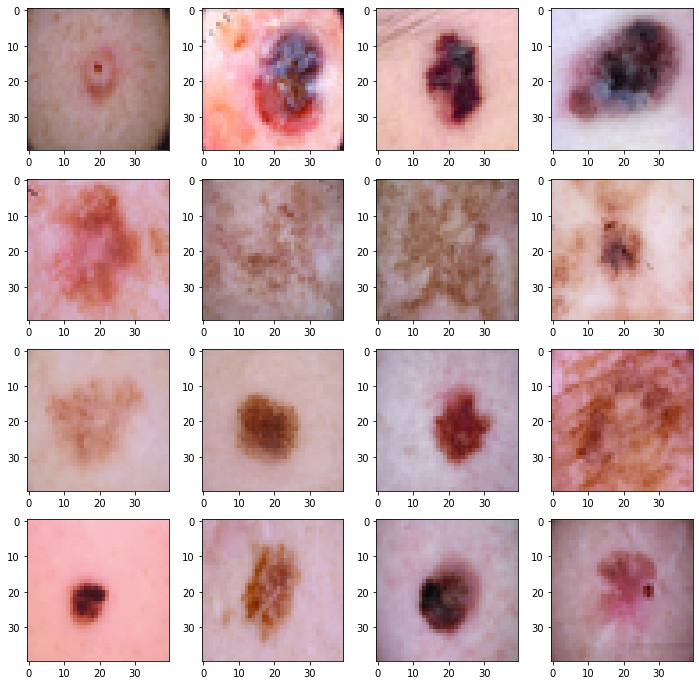

In [51]:
# Displaying images from the resampled combined train dataset
def display_images(imgs, path=""):
  _, axs = plt.subplots(4, 4, figsize=(12, 12))
  axs = axs.flatten() # returns a flattened version of the array
  for img, ax in zip(imgs, axs):
    # displaying the image
    ax.imshow(img)
  plt.show()

# Displaying some images of syntetic examples sampled with RandomOverSampling from the combined resampled train dataset
display_images(X_resampled[9000:])

### Experiments on the dataset

We investigate our dataset using different Machine Learning and Deep Learning models. We start from a dummy baseline model that use a random function to predict the outcomes i.e. Random Guess Classifier. Then, we experiment on the dataset using the following models:

#### TRADITIONAL ML MODELS:
* Softmax Regression
* Support Vector Machine

#### DEEP LEARNING:
* Multi Layer Perceptron (MLP) and Convolutional Neural Network (CNN)

#### ENSEMBLE LEARNING (BOOSTING):
* XGBoosting 

We select the best model basing on model performances over our validation set using the grid search algorithm to find the best hyperpameters configuration.

We use different training dataset in order to investigate the balanced data importance and the data augmentation effort.

#### Loading experiments data for ML models

In [52]:
# Loading saved train data from pickle
X_train, Y_train = open_pickle("train_data")
# Loading saved test data from pickle
X_test, Y_test = open_pickle("test_data")
# Loading saved validation data from pickle
X_val, Y_val = open_pickle("val_data")
# Loading saved undersampled dataset from pickle
X_train_undersampled, Y_train_undersampled = open_pickle("undersampled_train_data")
# Loading saved combined resampled i.e. both oversampled and undersampled dataset from pickle
X_train_combined, Y_train_combined = open_pickle("combined_train_data")

#### Data Augmentation

Random oversampling is performed on the dataset previously to remove the skew in the dataset, and this duplicates examples from the minority class in the training dataset. However, this can result in overfitting for some models. 

It is a good practice to use Data Augmentation if you want to prevent overfitting. Data Augmentation can be used to artificially expand the size of a training set by creating modified data from the existing one using several transformation techniques. In general, having a large dataset is crucial for the performance of both ML and Deep Learning (DL) models. We can improve the performance of the model by augmenting the data we already have. It means that Data Augmentation is also good for enhancing the model’s performance.

We use data augmentation in 3 of our 4 datasets, excluding the base dataset (without resampling) to exploit the help of this strategy in term of performances and generalization.

Augmentation techniques used:
* RandomRotate90: Randomly rotate the input by 90 degrees zero or more times  with probability p=0.5
* Transpose: Transpose the image randomly (90 degrees) with probability p=0.5
* Rotate: Rotate the image by a randomly selected angle with probability p=0.5
* Blur: Add blur effect to image with probability p=0.3 (tuned)
* RandomBrightness: Randomly change brightness of the input image
* RandomContrast: Randomly change contrast of the input image

Original Image
Augmented Image


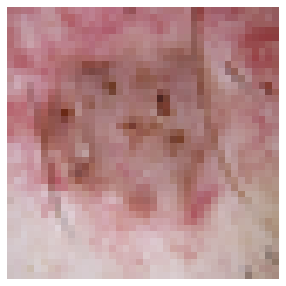

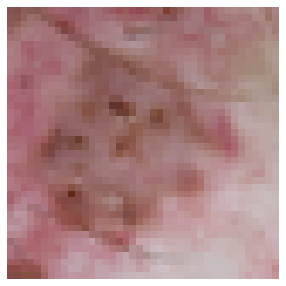

In [53]:
# Methods for creating and visualizing augmented images by transforming existing images using augmentation techniques
# Defining the augmentation transformation techniques 
transform = augmntlib.Compose(
    [
     augmntlib.RandomRotate90(), 
     augmntlib.Transpose(), 
     augmntlib.Rotate(p=.50), 
     augmntlib.Blur(blur_limit=1, p=.3), 
     augmntlib.RandomBrightness(), 
     augmntlib.RandomContrast(), 
     ])
# Creating the augmented image
def augment_image(img):
  return transform(image=img)['image']
# Displaying the image
def visualize_image(image):
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.imshow(image)

# Displaying original and augmented image example
%matplotlib inline
print('Original Image')
visualize_image(X_train[80])
print('Augmented Image')
visualize_image(augment_image(X_train[80]))

In [54]:
# Data Augmentation of train data, undersampled train data, and combined resampled train data
augmented_train_data = []
augmented_train_data_undersampled = []
augmented_train_data_combined = []
# Augmenting train data
for x in tqdm(X_train):
  augmented_train_data.append(augment_image(x))
# Augmenting undersampled train data
for y in tqdm(X_train_undersampled):
  augmented_train_data_undersampled.append(augment_image(y))
# Augmenting combined resampled train data
for z in tqdm(X_train_combined):
  augmented_train_data_combined.append(augment_image(z))

# Augmented train data
augmented_train_data = np.array(augmented_train_data)
print('Augmented train data:')
print(augmented_train_data)
print('Shape of augmented_train_data :',augmented_train_data.shape)

#Augmented undersampled train data
augmented_train_data_undersampled = np.array(augmented_train_data_undersampled)
print('Augmented undersampled train data:')
print(augmented_train_data_undersampled)
print('Shape of augmented_train_data_undersampled :',augmented_train_data_undersampled.shape)

# Augmented combined train data
augmented_train_data_combined = np.array(augmented_train_data_combined)
print('Augmented combined resampled train data:')
print(augmented_train_data_undersampled)
print('Shape of augmented_train_data_combined :',augmented_train_data_combined.shape)

100%|██████████| 17500/17500 [00:08<00:00, 2126.55it/s]


Augmented train data:
[[[[163  78  69]
   [161  75  66]
   [161  74  64]
   ...
   [188 105 100]
   [190 110 107]
   [194 118 118]]

  [[170  88  76]
   [167  86  77]
   [173  95  85]
   ...
   [199 125 130]
   [202 130 138]
   [205 136 150]]

  [[178 104  92]
   [181 109  99]
   [186 118 112]
   ...
   [204 136 148]
   [206 139 156]
   [207 144 161]]

  ...

  [[209 158 172]
   [209 158 172]
   [209 156 172]
   ...
   [209 167 179]
   [209 165 178]
   [209 164 177]]

  [[209 158 173]
   [209 158 172]
   [209 157 172]
   ...
   [210 166 180]
   [209 164 177]
   [209 164 177]]

  [[209 156 173]
   [209 158 173]
   [209 157 172]
   ...
   [209 166 177]
   [209 166 177]
   [209 165 177]]]


 [[[255 220 233]
   [255 215 225]
   [255 218 231]
   ...
   [255 199 208]
   [255 199 207]
   [255 200 209]]

  [[255 219 229]
   [255 216 227]
   [255 218 232]
   ...
   [255 198 208]
   [255 200 210]
   [255 200 207]]

  [[255 219 233]
   [255 220 235]
   [255 220 232]
   ...
   [255 200 213]
   [25

#### Grid Search for Hyperparameter Tuning

Grid-searching is the process of scanning the data to configure optimal parameters for a given model. Depending on the type of model utilized, certain parameters are necessary. Grid-searching not only applies to one model type. Grid-searching can be applied across machine learning to calculate the best parameters to use for any given model. Grid-Search will build a model on each parameter combination possible. It iterates through every parameter combination and stores a model for each combination.

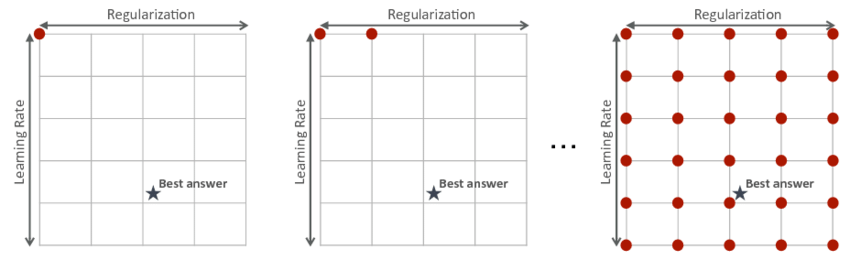

A hyperparameter optimization procedure involves defining a search space. This can be thought of geometrically as an n-dimensional volume, where each hyperparameter represents a different dimension and the scale of the dimension are the values that the hyperparameter may take on, such as real-valued, integer-valued, or categorical. 

A range of different optimization algorithms may be used, we use Grid Search here. Grid Search defines a search space as a grid of hyperparameter values and evaluate every position in the grid. Grid search is great for spot-checking combinations that are known to perform well generally. 

The evaluation metrics considered here are:

1. **Precision:** Ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. 

2. **Recall:** Ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples. The best value is 1 and the worst value is 0.

3. **F1:** Interpreted as a harmonic mean of the precision and recall. F1 score reaches its best value at 1 and worst score at 0. 

4. **Accuracy:** In multilabel classification, this function computes subset accuracy; the set of labels predicted for a sample must exactly match the corresponding set of labels in y_true.

In [55]:
# Defining method for Grid Search

def grid_search_method(grid, model, X_train, X_val, Y_train, Y_val):
  # creating a grid of parameters with a discrete number of values for each
  grid_search = ParameterGrid(grid) 
  # Defining the evaluation metrics
  precision_vals, recall_vals, f1_vals, accuracy_vals, param_vals = [], [], [], [], []  
  grid_search_results = pd.DataFrame()
  for p in tqdm(grid_search):
    model.set_params(**p)
    # fitting the model to train data
    model.fit(X_train, Y_train)
    # measuring on validation set
    validation_preds = model.predict(X_val)
    # calculating the evaluation metrics on validation data
    precision_vals.append(precision_score(validation_preds, Y_val, average="macro"))
    recall_vals.append(recall_score(validation_preds, Y_val, average="macro"))
    f1_vals.append(f1_score(validation_preds, Y_val, average="macro"))
    accuracy_vals.append(accuracy_score(validation_preds, Y_val))
    param_vals.append(p)

  grid_search_results["params"] = param_vals
  grid_search_results["accuracy"] = accuracy_vals
  grid_search_results["precision"] = precision_vals
  grid_search_results["recall"] = recall_vals
  grid_search_results["f1"] = f1_vals

  return grid_search_results

### Random Guess Classifier - Baseline

The main aim of a classification model is the ability to assign a class to an object based on its description or features. When we build a classification model, often we have to prove that the model we built is significantly better than random guessing. Here, we are using Random Guess Classifier as a baseline classifier. This is a non-machine learning classifier as it does not learn anything from the data and is built by assigning labels or classes arbitrarily through random guess. 

Assume we are working with data with population size 
n. The data is divided into two groups, with x% of the rows or instances belonging to one class (labeled positive or P) and (1−x)% belonging to another class (labeled negative or 
N). We will also assume that the majority of the data is labeled N. Random Guess Classifier randomly assigns half of the labels to P and the other half as N. 

We intend to prove that our classification models defined below  do a better job at detecting the difference between different classes and should have a better accuracy than random guess classifier. 

In [56]:
random_preds = []
for y in Y_test:
  # total 7 skin lesion classes under analysis here
  random_preds.append(choice(range(0,7)))

random_test_results = pd.DataFrame()
# Calculating evaluation metrics
random_test_results['accuracy'] = [accuracy_score(random_preds, Y_test)]
random_test_results['precision'] = [precision_score(random_preds, Y_test, average='macro')]
random_test_results['recall'] = [recall_score(random_preds, Y_test, average='macro')]
random_test_results['f1'] = [f1_score(random_preds, Y_test, average='macro')]
random_test_results['balanced_multiclass_accuracy'] = [balanced_accuracy_score(random_preds, Y_test)]

print(random_test_results)

# Exporting random guess classifier test results
random_test_results.to_csv('/gdrive/MyDrive/ADS/Project/random_test_results.csv')

   accuracy  precision    recall        f1  balanced_multiclass_accuracy
0  0.139434   0.160858  0.142263  0.096045                      0.142263


#### Classification Report

A classification report is a performance evaluation metric in machine learning. It is used to show the precision, recall, F1 Score, and support of the trained classification model. It provides a better understanding of the overall performance of the trained model. The metrics are explained as follows:

**Precision:** Precision is defined as the ratio of true positives to the sum of true and false positives.

**Recall:** Recall is defined as the ratio of true positives to the sum of true positives and false negatives.

**F1:** The F1 is the weighted harmonic mean of precision and recall. The closer the value of the F1 score is to 1.0, the better the expected performance of the model is.

**Support:** Support is the number of actual occurrences of the class in the dataset. It doesn’t vary between models, it just diagnoses the performance evaluation process.


In [57]:
# Printing classification report for random guess classifier
print('Classification report for Random Guess Classifier')
print(classification_report(random_preds, Y_test))

Classification report for Random Guess Classifier
              precision    recall  f1-score   support

           0       0.15      0.11      0.13       416
           1       0.13      0.65      0.22       412
           2       0.18      0.01      0.02       415
           3       0.15      0.12      0.13       462
           4       0.16      0.02      0.03       419
           5       0.16      0.06      0.09       427
           6       0.18      0.03      0.06       454

    accuracy                           0.14      3005
   macro avg       0.16      0.14      0.10      3005
weighted avg       0.16      0.14      0.10      3005



#### Confusion Matrix

Confusion Matrix is a tabular way of visualizing the performance of your prediction model. Each entry in a confusion matrix denotes the number of predictions made by the model where it classified the classes correctly or incorrectly. It gives a comparison between Actual and predicted values.

The confusion matrix is a N x N matrix, where N is the number of classes or outputs.
For example, for 2 class, we get 2 x 2 confusion matrix.
For example, for 3 class, we get 3 X 3 confusion matrix.

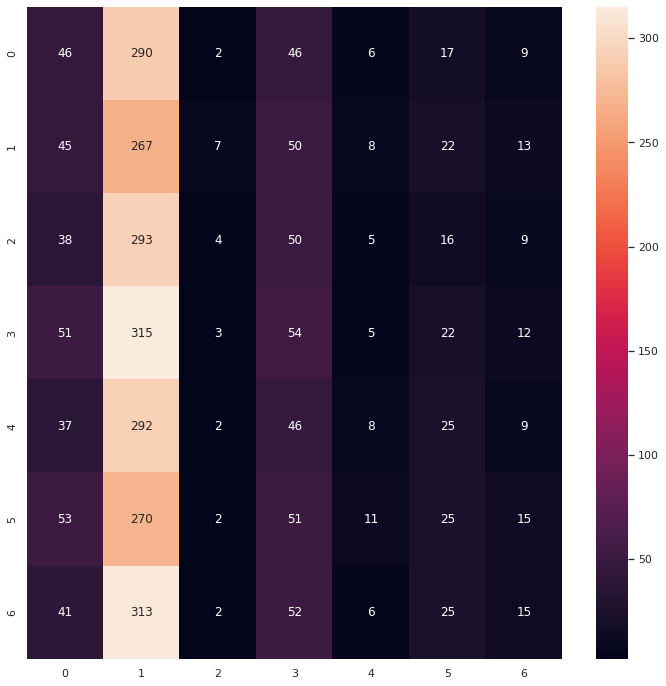

In [58]:
# Plotting confusion matrix for random guess classifier
sns.set(rc={'figure.figsize':(12,12)})
conf_matrix = confusion_matrix(random_preds, Y_test)
sns.heatmap(conf_matrix,  fmt="g", annot=True)

### Traditional ML Methods


### 1. Softmax Regression

Usually, we use the (standard) Logistic Regression model in binary classification tasks. But since our dataset is a multi-class one, Softmax Regression is a better fit in this case. Softmax Regression is the generalization of logistic regression that we can use for multi-class classification. It is also Multinomial Logistic, Maximum Entropy Classifier, or Multi-class Logistic Regression. 

Logistic regression is a classification algorithm. It is intended for datasets that have input variables and a categorical target variable that has two values or classes. Logistic regression is designed for two-class problems, hence it requires modification to support multi-class classification problems. Changing logistic regression from binomial to multinomial probability requires a change to the loss function used to train the model (e.g. log loss to cross-entropy loss), and a change to the output from a single probability value to one probability for each class label. 

The LogisticRegression class can be configured for multinomial logistic regression by setting the “multi_class” argument to “multinomial” and the “solver” argument to a solver that supports multinomial logistic regression, such as “lbfgs“.

The Logistic Regression hyperparameters defined here are C and solver. 

**C:** A high value of C tells the model to give more weight to the training data. A lower value of C will indicate the model to give complexity more weight at the cost of fitting the data. 
Thus, a high Hyper Parameter value C indicates that training data is more important and reflects the real world data, whereas low value is just the opposite of this.

**solver:** This specifies the algorithm to use in the optimization problem. Default is ‘lbfgs’. 'lbfgs' can also handle multinomial loss for multiclass problems. 

In [59]:
# Defining logistic regression parameters
logistic_regression_parameters = {
    "solver":["lbfgs"], # configuring to softmax regression
    "C":[1, 0.8, 0.6, 0.4, 0.2]
}

# Creating original train, augmented train, undersampled train, and combined train datasets
datasets = {
    "original":(X_train.reshape(-1, img_size*img_size*3), Y_train, X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "original_augmented":(augmented_train_data.reshape(-1, img_size*img_size*3), Y_train,  X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "undersampled":(augmented_train_data_undersampled.reshape(-1, img_size*img_size*3), Y_train_undersampled, X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "combined":(augmented_train_data_combined.reshape(-1, img_size*img_size*3), Y_train_combined, X_val.reshape(-1, img_size*img_size*3), Y_val)
    }

In [60]:
# Initialising the model
estimator = LogisticRegression()
results = {}
# Hyperparameter tuning on the model using grid search
for ds in datasets:
  r = grid_search_method(grid=logistic_regression_parameters, 
                      model=estimator, 
                      X_train=datasets[ds][0], 
                      Y_train=datasets[ds][1], 
                      X_val = datasets[ds][2], 
                      Y_val=datasets[ds][3]
                  )
  
  results[ds] = r

100%|██████████| 5/5 [05:15<00:00, 63.16s/it]


In [61]:
# Saving the logistic regression grid search results to pickle
save_pickle(results, "logistic_regression_grid_search")

In [62]:
# Loading the logistic regression grid search results from pickle
results = open_pickle("logistic_regression_grid_search")
results

{'combined':                           params  accuracy  precision    recall        f1
 0    {'C': 1, 'solver': 'lbfgs'}  0.529244   0.457874  0.304175  0.323719
 1  {'C': 0.8, 'solver': 'lbfgs'}  0.532097   0.462044  0.304187  0.325460
 2  {'C': 0.6, 'solver': 'lbfgs'}  0.536377   0.473974  0.315500  0.338605
 3  {'C': 0.4, 'solver': 'lbfgs'}  0.532097   0.487150  0.320674  0.343696
 4  {'C': 0.2, 'solver': 'lbfgs'}  0.530670   0.467067  0.307680  0.329964,
 'original':                           params  accuracy  precision    recall        f1
 0    {'C': 1, 'solver': 'lbfgs'}  0.684736   0.266406  0.432535  0.276378
 1  {'C': 0.8, 'solver': 'lbfgs'}  0.680456   0.254672  0.412922  0.266888
 2  {'C': 0.6, 'solver': 'lbfgs'}  0.679030   0.283719  0.416291  0.285693
 3  {'C': 0.4, 'solver': 'lbfgs'}  0.683310   0.260331  0.294028  0.261311
 4  {'C': 0.2, 'solver': 'lbfgs'}  0.689016   0.267276  0.439652  0.278284,
 'original_augmented':                           params  accuracy  precisi

In [63]:
# Appending dataset column to results
for r in results:
  results[r]["dataset"] = r
# Concatenating all dataset results in a single dataframe
all_models_results = pd.concat([
                                results["original"],
                                results["original_augmented"],
                                results["undersampled"],
                                results["combined"],
                                ])
# Sort and display all dataset results in descending order of f1
all_models_results.sort_values("f1", ascending=False).to_csv("/gdrive/MyDrive/ADS/Project/logistic_regression_performances.csv")
all_models_results.sort_values("f1", ascending=False)

,params,accuracy,precision,recall,f1,dataset
3,"{'C': 0.4, 'solver': 'lbfgs'}",0.532097,0.487150,0.320674,0.343696,combined
2,"{'C': 0.6, 'solver': 'lbfgs'}",0.536377,0.473974,0.315500,0.338605,combined
4,"{'C': 0.2, 'solver': 'lbfgs'}",0.530670,0.467067,0.307680,0.329964,combined
1,"{'C': 0.8, 'solver': 'lbfgs'}",0.532097,0.462044,0.304187,0.325460,combined
0,"{'C': 1, 'solver': 'lbfgs'}",0.529244,0.457874,0.304175,0.323719,combined
2,"{'C': 0.6, 'solver': 'lbfgs'}",0.670471,0.295300,0.455250,0.311488,undersampled
1,"{'C': 0.8, 'solver': 'lbfgs'}",0.671897,0.292871,0.462341,0.310945,undersampled
3,"{'C': 0.4, 'solver': 'lbfgs'}",0.666191,0.297450,0.455794,0.310539,undersampled
4,"{'C': 0.2, 'solver': 'lbfgs'}",0.663338,0.272891,0.444008,0.293194,undersampled
2,"{'C': 0.6, 'solver': 'lbfgs'}",0.679030,0.283719,0.416291,0.285693,original


In [64]:
# Method to extract C value (logistic regression parameter) from params column
def extract_C_value(row):
  return float(row.split(",")[0].split(":")[1].strip())

# Loading logistic regression datasets performance data
all_models_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/logistic_regression_performances.csv")
print('Printing all_models_results')
print(all_models_results)

# Extracting C value from params for combined dataset type
all_models_results_combined = all_models_results[all_models_results["dataset"]=="combined"]
all_models_results_combined["C"] = all_models_results_combined["params"].apply(extract_C_value)
all_models_results_combined = all_models_results_combined.sort_values("C") 
print('Printing all_models_results_combined')
print(all_models_results_combined)

Printing all_models_results
    Unnamed: 0                         params  accuracy  precision    recall  \
0            3  {'C': 0.4, 'solver': 'lbfgs'}  0.532097   0.487150  0.320674   
1            2  {'C': 0.6, 'solver': 'lbfgs'}  0.536377   0.473974  0.315500   
2            4  {'C': 0.2, 'solver': 'lbfgs'}  0.530670   0.467067  0.307680   
3            1  {'C': 0.8, 'solver': 'lbfgs'}  0.532097   0.462044  0.304187   
4            0    {'C': 1, 'solver': 'lbfgs'}  0.529244   0.457874  0.304175   
5            2  {'C': 0.6, 'solver': 'lbfgs'}  0.670471   0.295300  0.455250   
6            1  {'C': 0.8, 'solver': 'lbfgs'}  0.671897   0.292871  0.462341   
7            3  {'C': 0.4, 'solver': 'lbfgs'}  0.666191   0.297450  0.455794   
8            4  {'C': 0.2, 'solver': 'lbfgs'}  0.663338   0.272891  0.444008   
9            2  {'C': 0.6, 'solver': 'lbfgs'}  0.679030   0.283719  0.416291   
10           0    {'C': 1, 'solver': 'lbfgs'}  0.657632   0.267354  0.428384   
11          

Text(0.5, 1.0, 'C vs f1')

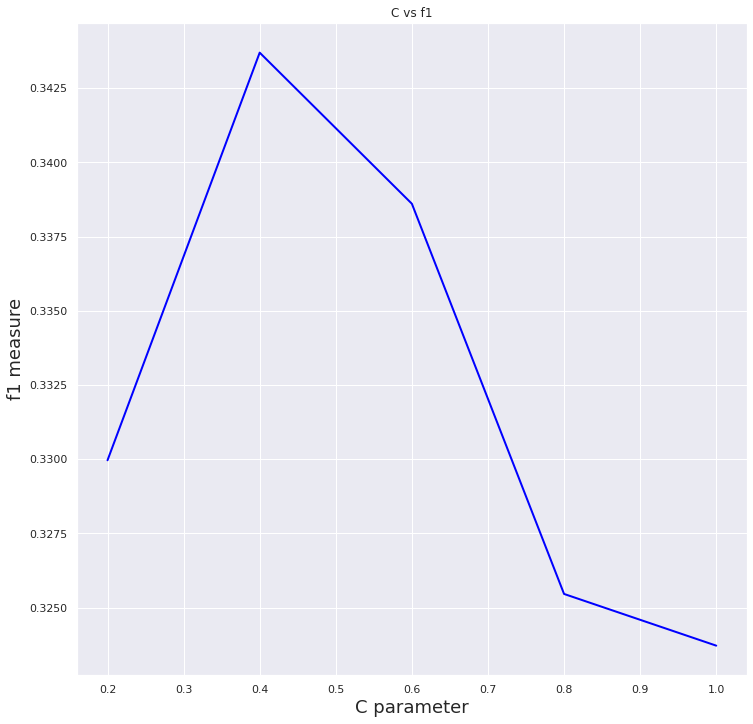

In [65]:
# Plotting C vs f1 values for combined dataset results
plt.plot(all_models_results_combined["C"], all_models_results_combined["f1"].values, color='blue', linestyle='solid',linewidth=2)
plt.xlabel('C parameter', fontsize=18)
plt.ylabel('f1 measure', fontsize=18)
plt.title('C vs f1')

In [66]:
# For best model
best_logistic_reg_model = all_models_results.sort_values("f1", ascending=False).values[0]
best = LogisticRegression()
#print(best_logistic_reg_model[1])
best.set_params(**ast.literal_eval(best_logistic_reg_model[1]))
best.fit(datasets[best_logistic_reg_model[6]][0], datasets[best_logistic_reg_model[6]][1])

LogisticRegression(C=0.4)

The evaluation metrics calculated in our models i.e. Precision, Recall, and F1-score are **macro-averaged.** This calculates metrics for each class individually and then takes unweighted mean of the measures. This is done as our dataset falls under multiclass classification. 

In [67]:
# Logistic Regression Test
preds = best.predict(X_test.reshape(-1, img_size*img_size*3))
# Logistic Regression results
test_results = pd.DataFrame()
test_results["accuracy"] = [accuracy_score(preds, Y_test)]
test_results["precision"] = [precision_score(preds, Y_test, average="macro")]
test_results["recall"] = [recall_score(preds, Y_test, average="macro")]
test_results["f1"] = [f1_score(preds, Y_test, average="macro")]
test_results["balanced_multiclass_accuracy"] = [balanced_accuracy_score(preds, Y_test)]
# Saving the logistic regression results to csv
test_results.to_csv("/gdrive/MyDrive/ADS/Project/logistic_regression_test_results.csv")
test_results

,accuracy,precision,recall,f1,balanced_multiclass_accuracy
0,0.526123,0.48109,0.309528,0.330309,0.309528


In [68]:
# Printing classification report for Logistic Regression
print('Classification report for Logistic Regression')
print(classification_report(preds, Y_test))

Classification report for Logistic Regression
              precision    recall  f1-score   support

           0       0.30      0.31      0.31       296
           1       0.58      0.91      0.71      1304
           2       0.55      0.09      0.15       141
           3       0.48      0.26      0.34       658
           4       0.80      0.22      0.34       178
           5       0.36      0.27      0.31       200
           6       0.30      0.11      0.16       228

    accuracy                           0.53      3005
   macro avg       0.48      0.31      0.33      3005
weighted avg       0.51      0.53      0.47      3005



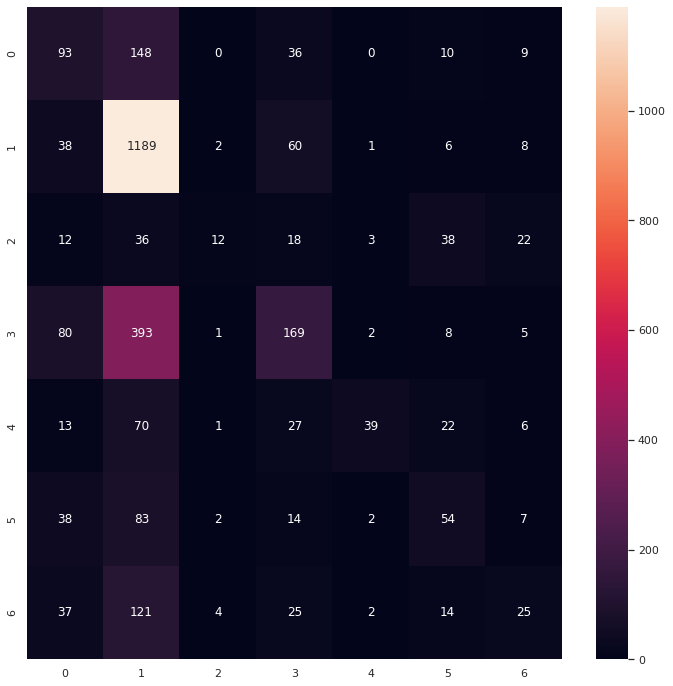

In [69]:
# Plotting confusion matrix for logistic regression
sns.set(rc={'figure.figsize':(12,12)})
conf_matrix = confusion_matrix(preds, Y_test)
sns.heatmap(conf_matrix,  fmt="g", annot=True)

### 2. SVM

SVM is a supervised machine learning algorithm that helps in classification  problems. It aims to find an optimal boundary between the possible outputs. SVM does complex data transformations depending on the selected kernel function and based on that transformations, it tries to maximize the separation boundaries between the data points depending on the labels or classes defined. 

In the SVM algorithm, we plot each data item as a point in n-dimensional space (where n is number of features you have) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the best hyper-plane that differentiates the two classes.

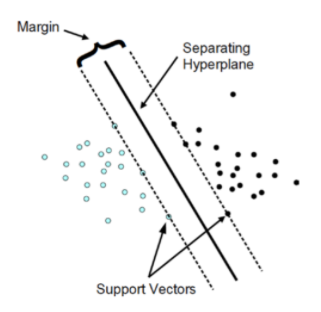

The SVM hyperparameters defined are as follows:

**C:** This is the regularization parameter of SVM. The C parameter tells the SVM optimization how much you want to avoid misclassifying each training example. For large values of C, the optimization will choose a smaller-margin hyperplane if that hyperplane does a better job of getting all the training points classified correctly. Conversely, a very small value of C will cause the optimizer to look for a larger-margin separating hyperplane, even if that hyperplane misclassifies more points. For very tiny values of C, you should get misclassified examples, often even if your training data is linearly separable.

**gamma:** The gamma parameter defines how far the influence of a single training example reaches, with low values meaning 'far' and high values meaning 'close'. The gamma parameters can be seen as the inverse of the radius of influence of samples selected by the model as support vectors.

**kernel:** In our experiments we use rbf kernel function to "project" data (non-linear transformation) into a new high-dimensional feature space  where we aim to find a linear separation of our original data. It is parameterized by a length scale parameter , which can either be a scalar or a vector with the same number of dimensions as the inputs X.

**class_weight:** The class_weight is a dictionary that defines each class label (e.g. 0 and 1) and the weighting to apply to the C value in the calculation of the soft margin. We are setting class_weight to ‘balanced.’ 

In [70]:
# Defining SVM hyperparameters
SVM_parameters = {
    "C":[1, 0.6, 0.2],
    "gamma" : [0.1, 1],
    "kernel":["rbf"],
    "class_weight":["balanced"],
}

In [71]:
# Standardizing the data (mean 0 and variance 1) for classification task using StandardScaler
def normalize_data(x_train, y_train, x_val, y_val):
  # converting x_train and x_val from 4-dim to 2-dim
  train_reshape = x_train.reshape(-1, img_size*img_size*3) 
  val_reshape = x_val.reshape(-1, img_size*img_size*3)
  # normalize and fit all features of train_reshape
  scaler = StandardScaler()
  scaler.fit(train_reshape)
  # return the transformed data after normalization and fitting
  return scaler.transform(train_reshape), y_train, scaler.transform(val_reshape), y_val

In [72]:
# Initialising the model
estimator = SVC()
results = {}
# Creating original train, augmented train, undersampled train, and combined train datasets
datasets = {
    "original":normalize_data(X_train, Y_train, X_val, Y_val), 
    "original_augmented":normalize_data(augmented_train_data, Y_train, X_val, Y_val), 
    "undersampled":normalize_data(augmented_train_data_undersampled, Y_train_undersampled, X_val, Y_val), 
    "combined":normalize_data(augmented_train_data_combined, Y_train_combined, X_val, Y_val)
    }
# Hyperparameter tuning on the model using grid search
for ds in datasets:
  r = grid_search_method(grid=SVM_parameters, 
                      model=estimator, 
                      X_train=datasets[ds][0], 
                      Y_train=datasets[ds][1], 
                      X_val = datasets[ds][2], 
                      Y_val=datasets[ds][3]
                  )
  results[ds] = r

100%|██████████| 6/6 [3:28:37<00:00, 2086.26s/it]


In [73]:
# Saving the SVM grid search results to pickle
save_pickle(results, "SVM_grid_search", drive= False)

In [74]:
# Appending dataset column to results
for r in results:
  results[r]["dataset"] = r
# Concatenating all dataset results in a single dataframe
all_models_results = pd.concat([
                                results["original"],
                                results["original_augmented"],
                                results["undersampled"],
                                results["combined"],
                                ])
# Sort and display all dataset results in descending order of F1
all_models_results.sort_values("f1", ascending=False).to_csv("/gdrive/MyDrive/ADS/Project/SVM_performances.csv")
all_models_results.sort_values("f1", ascending=False)

,params,accuracy,precision,recall,f1,dataset
0,"{'C': 1, 'class_weight': 'balanced', 'gamma': ...",0.656205,0.142857,0.093744,0.113203,original
1,"{'C': 1, 'class_weight': 'balanced', 'gamma': ...",0.656205,0.142857,0.093744,0.113203,original
4,"{'C': 0.2, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,combined
3,"{'C': 0.6, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,combined
2,"{'C': 0.6, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,combined
1,"{'C': 1, 'class_weight': 'balanced', 'gamma': ...",0.656205,0.142857,0.093744,0.113203,combined
0,"{'C': 1, 'class_weight': 'balanced', 'gamma': ...",0.656205,0.142857,0.093744,0.113203,combined
3,"{'C': 0.6, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,undersampled
2,"{'C': 0.6, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,undersampled
5,"{'C': 0.2, 'class_weight': 'balanced', 'gamma'...",0.656205,0.142857,0.093744,0.113203,combined


In [75]:
# For best model
best_svm_model = all_models_results.sort_values("f1", ascending=False).values[0]
best = SVC()
print(best_svm_model[0])
best.set_params(**best_svm_model[0])
best.fit(datasets[best_svm_model[5]][0], datasets[best_svm_model[5]][1])

{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


SVC(C=1, class_weight='balanced', gamma=0.1)

In [76]:
# Standardizing and fitting the data (mean 0 and variance 1) using StandardScaler
scaler = StandardScaler()
scaler.fit(datasets[best_svm_model[5]][0])
# converting X_test from 4-dim to 2-dim
X_test_dim2 = X_test.reshape(-1,3*img_size*img_size) 
# transforming the standardized data and SVM testing
preds = best.predict(scaler.transform(X_test_dim2))
# SVM results
test_results = pd.DataFrame()
# Calculating evaluation metrics 
test_results["accuracy"] = [accuracy_score(preds, Y_test)]
test_results["precision"] = [precision_score(preds, Y_test, average="macro")]
test_results["recall"] = [recall_score(preds, Y_test, average="macro")]
test_results["f1"] = [f1_score(preds, Y_test, average="macro")]
test_results["balanced_multiclass_accuracy"] = [balanced_accuracy_score(preds, Y_test)]
# Storing SVM results in csv
test_results.to_csv("/gdrive/MyDrive/ADS/Project/SVM_test_results.csv")
test_results

,accuracy,precision,recall,f1,balanced_multiclass_accuracy
0,0.678869,0.142857,0.096981,0.115532,0.678869


In [77]:
# Printing classification report for SVM
print('Classification report for SVM')
print(classification_report(preds, Y_test))

Classification report for SVM
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.68      0.81      3005
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0

    accuracy                           0.68      3005
   macro avg       0.14      0.10      0.12      3005
weighted avg       1.00      0.68      0.81      3005



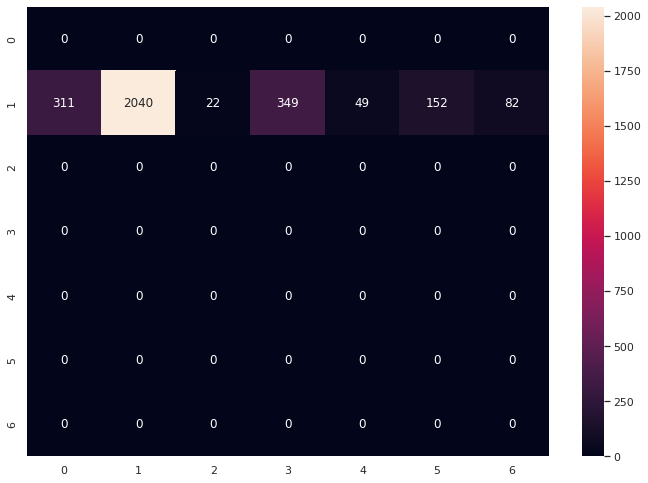

In [78]:
# Confusion Matrix for SVM
sns.set(rc={'figure.figsize':(11.7,8.27)})
cf_matrix = confusion_matrix(preds, Y_test)
sns.heatmap(cf_matrix,  fmt="g", annot=True)

### Deep Learning

In our experiments, we are investigating **Multi Layer Perceptron (MLP)** and **Convolutional Neural Network (CNN)**, State-of-the-Art (SOTA) in image processing and classification. MLP and CNN are commonly used in Deep learning while building Machine Learning Model.

Both MLP and CNN can be used for Image classification however MLP takes vector as input and CNN takes tensor as input so CNN can understand spatial relation(relation between nearby pixels of image)between pixels of images better thus for complicated images CNN will perform better than MLP. CNN is designed to work for Images or Videos classification. We can conclude that MLP is good for simple image classification and CNN is good for complicated image classification. 



The neural network hyperparameters can be defined as follows:

 1. **Batch Size:** The batch size defines the number of samples that will be propagated through the network. Batch size controls the accuracy of the estimate of the error gradient when training neural networks. A batch size of 32 means that 32 samples from the training dataset will be used to estimate the error gradient before the model weights are updated. One training epoch means that the learning algorithm has made one pass through the training dataset, where examples were separated into randomly selected “batch size” groups.

 2. **Flattening image size:** Flattening is converting the data into a 1-dimensional array for inputting it to the next layer. We flatten the output of the convolutional layers to create a single long feature vector. And it is connected to the final classification model, which is called a fully-connected layer. In other words, we put all the pixel data in one line and make connections with the final layer. 

 3. **Number of classes:** This defines the number of classes or labels under which the image fits better in a classification problem. Here, we are dealing with a multi-classification problem with the number of classes being skin lesion types (which is 8).

 4. **Epochs:** An epoch means training the neural network with all the training data for one cycle. In an epoch, we use all of the data exactly once. A forward pass and a backward pass together are counted as one pass. An epoch is made up of one or more batches, where we use a part of the dataset to train the neural network. We call passing through the training examples in a batch an iteration.

In [79]:
# Defining Neural Network hyperparameters

# batch size
batch_size_train = 32 # batch size of 32 works well generally by default
batch_size_test = 128

# image size (flatten)
input_size = img_size*img_size*3

# number of classes
num_classes = len(np.unique(Y_train))

# epochs
max_epochs = 10

#### Callbacks in CNN

A callback is a set of functions to be applied at given stages of the training procedure. You can use callbacks to get a view on internal states and statistics of the model during training. You define and use a callback when you want to automate some tasks after every training/epoch that help you have controls over the training process. This includes stopping training when you reach a certain accuracy/loss score, saving your model as a checkpoint after each successful epoch, adjusting the learning rates over time etc. 

In [80]:
# Defining Callback class which defines functions which are called different stages of the training loop
# This class itself doesn’t do much, if we inserted this code into training loop, it wouldn’t change anything. 
# Reason for this class is to use it as a template for specific callbacks that modify training loop.
# Callback uses inheritance by using base CallBack class and only re-defining functions that are necessary for specific callback.

class MetricsCallback(Callback):
  # initializations of all callbacks
  def __init__(self, test_data, y_true):
      self.y_true = y_true
      self.test_data = test_data
      self.results = []
      
  # defining callback for after every epoch end, which generates prediction results and prints classification report 
  def on_epoch_end(self, epoch, logs=None):
        y_pred = self.model.predict(self.test_data)
        y_pred = tf.argmax(y_pred,axis=1)
        report_dictionary = classification_report(self.y_true, y_pred, output_dict = True)
        print('Classification Report')
        print(classification_report(self.y_true,y_pred,output_dict=False))
        self.results.append(report_dictionary)

### Multilayer Perceptron (MLP)

MLPs (Multilayer Perceptron) use one perceptron for each input (e.g. pixel in an image) and the amount of weights rapidly becomes unmanageable for large images. It includes too many parameters because it is fully connected. Each node is connected to every other node in next and the previous layer, forming a very dense web — resulting in redundancy and inefficiency. As a result, difficulties arise whilst training and overfitting can occur which makes it lose the ability to generalize.

In [81]:
# Defining the MLP model
def MLPModel(input_dim, num_classes, dropout):
  # # The simplest model is defined in the Sequential class which is a linear stack of Layers
  model = Sequential() 
  # A preprocessing layer which rescales input values to a new range.
  model.add(layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_size, img_size, 3)))
  # input is now flattened, batch size is not affected
  model.add(Flatten())
  # Here, the layer type used is Dense which is fully connected layer and the most common type of layer used on multi-layer perceptron models.
  # An activation function in a neural network defines how the weighted sum of the input is transformed into an output from a node or nodes in a layer of the network.
  # Here, the activation argument is set to relu, which applies the rectified linear unit activation function.
  model.add(Dense(350, activation='relu'))
  model.add(Dense(50, activation='relu'))
  # Here, the activation argument is set to softmax, which converts a vector of values to a probability distribution. The elements of the output vector are in range (0, 1) and sum to 1.
  model.add(Dense(num_classes, activation='softmax'))
  # returning the model
  return model

In [82]:
# Creating the MLP model 

# Dropout is a regularization method that approximates training a large number of neural networks with different architectures in parallel.
# It is a simple way to prevent Neural Networks from Overfitting. 
# In this case, nodes to be dropped-out are randomly selected with 30% probability each weight update cycle

# lr stands for learning rate. 
# The learning rate is a hyperparameter that controls how much to change the model in response to the estimated error each time the model weights are updated. 
# Choosing the learning rate is challenging as a value too small may result in a long training process that could get stuck, 
# whereas a value too large may result in learning a sub-optimal set of weights too fast or an unstable training process.

def create_mlp_model(dropout=0.3, lr=2e-2, train_batch_size = 16):
  model = MLPModel(img_size*img_size*3, num_classes=num_classes, dropout=dropout)
  
# Optimizers are algorithms or methods used to change the attributes of the neural network such as weights and learning rate to reduce the losses. 
# They are used to solve optimization problems by minimizing the function.

# The purpose of loss functions is to compute the quantity that a model should seek to minimize during training.
# Here, we are using the probabilistic loss sparse_categorical_crossentropy

  # instantiating the optimizer optimizer and loss
  model.compile(
        tf.keras.optimizers.Adam(learning_rate=lr),
        loss="sparse_categorical_crossentropy", 
        metrics=['accuracy']
        )
  
  # model callbacks
  metrics_callback = MetricsCallback(test_data=X_val, y_true=Y_val)
  
# Early Stopping: One way to avoid overfitting of data is to terminate the process early. 
# The EarlyStoppingfunction has various metrics/arguments that you can modify to set up when the training process should stop.

# Checkpoint: This callback saves the model after every epoch.

  # defining early stopping and checkpoint callbacks
  callbacks = [
               tf.keras.callbacks.EarlyStopping(monitor='val_loss', # value being monitored, i.e: val_loss
                                min_delta=2e-2, # minimum change in the monitored value; training process will be stopped if the absolute change of the monitored value is less than min_delta
                                patience=3, # number of epochs with no improvement after which training will be stopped
                                verbose=1, # Verbosity mode, 0 or 1. Mode 0 is silent, and mode 1 displays messages when the callback takes an action
                                mode='min', # implying to minimize the loss
                                baseline=None, # Training will stop if the model doesn't show improvement over the baseline.
                                restore_best_weights=True), # keep the best weights once stopped
               
             tf.keras.callbacks.ModelCheckpoint("/gdrive/MyDrive/ADS/Project/", # saving the model to this path after every epoch
                                     monitor='val_loss', 
                                     verbose=1, 
                                     save_best_only=True, # set to True to not overwrite the latest best model
                                     save_weights_only=False, # if True, then only the model's weights will be saved, else the full model is saved
                                     mode='auto', 
                                     save_freq='epoch'), # callback saves the model after each epoch
             metrics_callback]

  return model, callbacks

In [83]:
# Defining method for computing class weights
def compute_class_weights(Y_train):
  weights = np.full(7, len(Y_train))
  weights = dict(enumerate(weights))
  for w in weights:
    weights[w] = weights[w] / (num_classes * Counter(Y_train)[w] ) 
  return weights

In [84]:
# MLP model fitting 
def mlp_experiment(X_train, Y_train, X_val, Y_val, dropout=0.3, lr=2e-2, train_batch_size = 16):
  model, callbacks = create_mlp_model(dropout, lr, train_batch_size)
  epochs=10 # number of epochs
  history = model.fit(
    X_train,
    Y_train,
    validation_data=(X_val, Y_val),
    epochs=epochs,
    callbacks=callbacks,
    batch_size=batch_size_train,
    shuffle=True,
    class_weight=compute_class_weights(Y_train)
  )
  return history, callbacks

In [85]:
# Defining method for MLP hyperparameter tuning
def mlp_hyp_tuning(datasets, hyperparams):
  results = {}
  for d in datasets:
    data = datasets[d]
    for hyp in hyperparams:
      h, c = mlp_experiment(X_train=data[0],Y_train=data[1],X_val=data[2], Y_val=data[3], 
                            dropout=hyp["dropout"], 
                            lr=hyp["lr"], 
                            train_batch_size=hyp["train_batch_size"])
      # identifying the best epoch as the one with minimum val_loss
      best_epoch = np.argmin(h.history["val_loss"]) 
      # adding to results
      results[f"{d}_{hyp}"] = (h, c[-1].results[best_epoch], best_epoch)
  return results

In [86]:
# Defining MLP hyperparameters
mlp_params = [
        {"dropout":0.2, "lr":2e-2, "train_batch_size":64},
        {"dropout":0.3, "lr":3e-2, "train_batch_size":128},
]
# defining the dataset with augmented_train_data_combined
datasets = {
    "combined":(np.array(augmented_train_data_combined), Y_train_combined, X_val, Y_val)
    }
# Performing hyperparameter tuning on combined dataset
mlp_results = mlp_hyp_tuning(datasets=datasets, hyperparams=mlp_params)

Epoch 1/10
546/547 [============================>.] - ETA: 0s - loss: 3.4271 - accuracy: 0.1402
Epoch 1: val_loss improved from inf to 1.97736, saving model to /gdrive/MyDrive/ADS/Project/
INFO:tensorflow:Assets written to: /gdrive/MyDrive/ADS/Project/assets
Classification Report
              precision    recall  f1-score   support

           0       0.12      1.00      0.22        85
           1       0.00      0.00      0.00       460
           2       0.00      0.00      0.00        11
           3       0.00      0.00      0.00        82
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00        30
           6       0.00      0.00      0.00        27

    accuracy                           0.12       701
   macro avg       0.02      0.14      0.03       701
weighted avg       0.01      0.12      0.03       701

547/547 [==============================] - 12s 19ms/step - loss: 3.4248 - accuracy: 0.1401 - val_loss: 1.9774 - val_accura

In [87]:
# Method for storing the MLP results in a cleaner specified format
def format_results(res):
  exp = pd.DataFrame()
  models = []
  accuracies = []
  precisions = []
  recalls = []
  f1s = []

  for r in res:
    models.append(r)
    df = pd.DataFrame(res[r][1])
    # Calculating evaluation metrics
    accuracies.append(df["accuracy"].values[0])
    precisions.append(df["macro avg"].values[0])
    recalls.append(df["macro avg"].values[1])
    f1s.append(df["macro avg"].values[2])
  # Appending these metrics to results dataframe
  exp["model"] = models
  exp["accuracy"] = accuracies
  exp["precision"] = precisions
  exp["recall"] = recalls
  exp["f1"] = f1s

  return exp

# Storing MLP results in a specific format for ease of understanding 
mlp_presults = format_results(mlp_results)

In [88]:
# Storing MLP hyperparameter tuning results in the specified format to csv
mlp_presults.to_csv("/gdrive/MyDrive/ADS/Project/MLP_hyperparameterization.csv")
mlp_presults

,model,accuracy,precision,recall,f1
0,"combined_{'dropout': 0.2, 'lr': 0.02, 'train_b...",0.038516,0.005502,0.142857,0.010597
1,"combined_{'dropout': 0.3, 'lr': 0.03, 'train_b...",0.008559,0.001223,0.142857,0.002425


Text(0, 0.5, 'Loss')

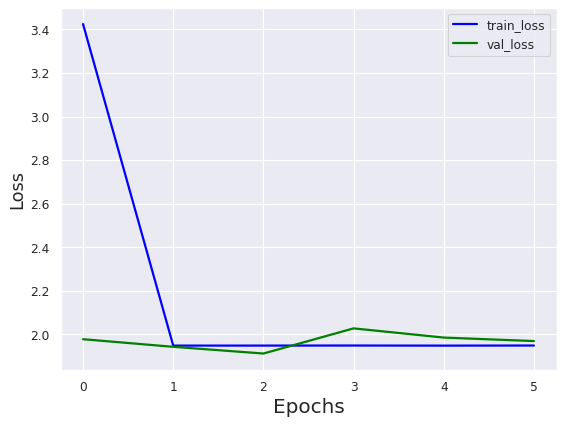

In [89]:
# Plotting epochs vs training data loss and validation data loss
from matplotlib.pyplot import figure
best = mlp_presults.sort_values("f1", ascending=False).values[0]
figure(figsize=(8, 6), dpi=80)
history = mlp_results[str(best[0])][0]
plt.plot(history.epoch, history.history["loss"], color='blue',linewidth=2, markersize=12, label="train_loss")
plt.plot(history.epoch, history.history["val_loss"], color='green',linewidth=2, markersize=12,  label="val_loss")
plt.legend()
plt.xlabel('Epochs', fontsize=18)
plt.ylabel('Loss', fontsize=16)

In [90]:
# Displaying results classification report
val_results = pd.DataFrame(mlp_results[str(best[0])][1]).transpose()
val_results

,precision,recall,f1-score,support
0,0.000000,0.000000,0.000000,85.000000
1,0.000000,0.000000,0.000000,460.000000
2,0.000000,0.000000,0.000000,11.000000
3,0.000000,0.000000,0.000000,82.000000
4,0.000000,0.000000,0.000000,6.000000
5,0.000000,0.000000,0.000000,30.000000
6,0.038516,1.000000,0.074176,27.000000
accuracy,0.038516,0.038516,0.038516,0.038516
macro avg,0.005502,0.142857,0.010597,701.000000
weighted avg,0.001484,0.038516,0.002857,701.000000


In [91]:
# Finding the best epoch 
best_epoch = mlp_results[str(best[0])][2]
print('Best Epoch value = ',best_epoch)

Best Epoch value =  2


In [92]:
# displaying the MLP hyperparameters for the best epoch instance
dataset_name = best[0].split("_")[0]
best_data = datasets[dataset_name]
best_conf = mlp_params[mlp_params.index(ast.literal_eval(best[0].split(dataset_name+"_")[1]))]
best_conf

{'dropout': 0.2, 'lr': 0.02, 'train_batch_size': 64}

In [93]:
# Creating MLP model with the best epoch hyperparameters
best_model, callbacks = create_mlp_model(best_conf["dropout"], best_conf["lr"], best_conf["train_batch_size"])

In [94]:
# Retraining best model
epochs=best_epoch + 1
history = best_model.fit(
  X_train,
  Y_train,
  validation_data=(X_val, Y_val),
  epochs=epochs,
  callbacks=[callbacks[-1]],
  batch_size=batch_size_train,
  shuffle=True
)

Epoch 1/3
198/198 [==============================] - ETA: 0s - loss: 6.1622 - accuracy: 0.6202Classification Report
              precision    recall  f1-score   support

           0       0.26      0.18      0.21        85
           1       0.68      0.95      0.79       460
           2       0.00      0.00      0.00        11
           3       0.00      0.00      0.00        82
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00        30
           6       0.00      0.00      0.00        27

    accuracy                           0.64       701
   macro avg       0.13      0.16      0.14       701
weighted avg       0.48      0.64      0.54       701

198/198 [==============================] - 4s 17ms/step - loss: 6.1622 - accuracy: 0.6202 - val_loss: 1.2154 - val_accuracy: 0.6434
Epoch 2/3
197/198 [============================>.] - ETA: 0s - loss: 1.0930 - accuracy: 0.6536Classification Report
              precision    recall  f1-s

In [95]:
# prediction calculation and F1 score for best model
test_preds = np.argmax(best_model.predict(X_test), axis=1)
f1_score(test_preds, Y_test, average="macro")

0.11553164377743168

In [96]:
test_results = pd.DataFrame()
# Calculating evaluation metrics
test_results["accuracy"] = [accuracy_score(test_preds, Y_test)]
test_results["precision"] = [precision_score(test_preds, Y_test, average="macro")]
test_results["recall"] = [recall_score(test_preds, Y_test, average="macro")]
test_results["f1"] = [f1_score(test_preds, Y_test, average="macro")]
test_results["balanced_multiclass_accuracy"] = [balanced_accuracy_score(test_preds, Y_test)]
# Storing the MLP results in csv
test_results.to_csv("/gdrive/MyDrive/ADS/Project/mlp_test_results.csv")
test_results

,accuracy,precision,recall,f1,balanced_multiclass_accuracy
0,0.678869,0.142857,0.096981,0.115532,0.678869


In [97]:
# Printing classification report for MLP
print('Classification report for MLP')
print(classification_report(test_preds, Y_test))

Classification report for MLP
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.68      0.81      3005
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0

    accuracy                           0.68      3005
   macro avg       0.14      0.10      0.12      3005
weighted avg       1.00      0.68      0.81      3005



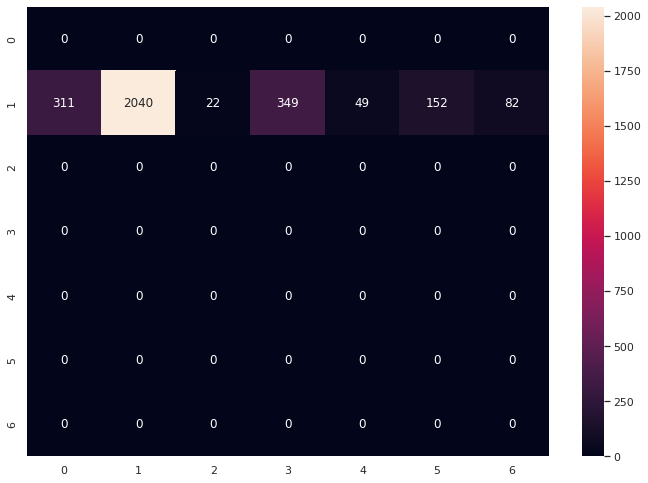

In [98]:
# confusion matrix for MLP
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
cf_matrix = confusion_matrix(test_preds, Y_test)
sns.heatmap(cf_matrix,  fmt="g", annot=True)

One common problem is that MLPs react differently to an input (images) and its shifted version, and they are not translation invariant. For example, if a picture of a cat appears in the top left of the image in one picture and the bottom right of another picture, the MLP will try to correct itself and assume that a cat will always appear in this section of the image.

Hence, MLPs are not the best idea to use for image processing. One of the main problems is that spatial information is lost when the image is flattened(matrix to vector) into an MLP.

### Convolutional Neural Network (CNN)

The convolutional neural network (CNN) is a class of deep learning neural networks. CNNs represent a huge breakthrough in image recognition. They’re most commonly used to analyze visual imagery and are frequently working behind the scenes in image classification. A CNN convolves (not convolutes…) learned features with input data and uses 2D convolutional layers. This means that this type of network is ideal for processing 2D images. Compared to other image classification algorithms, CNNs actually use very little preprocessing. This means that they can learn the filters that have to be hand-made in other algorithms. 

The 5 layer CNN architecture followed in this case is:

1. **Convolutional Layer**:
This layer is the first layer that is used to extract the various features from the input images. In this layer, the mathematical operation of convolution is performed between the input image and a filter of a particular size MxM. The output is termed as the Feature map which gives us information about the image such as the corners and edges. Later, this feature map is fed to other layers to learn several other features of the input image.

2. **Pooling Layer**:
In most cases, a Convolutional Layer is followed by a Pooling Layer. The primary aim of this layer is to decrease the size of the convolved feature map to reduce the computational costs. This is performed by decreasing the connections between layers and independently operates on each feature map. In Max Pooling, the largest element is taken from feature map.

3. **Fully Connected Layer**:
The Fully Connected (FC) layer consists of the weights and biases along with the neurons and is used to connect the neurons between two different layers. In this, the input image from the previous layers are flattened and fed to the FC layer. The flattened vector then undergoes few more FC layers where the mathematical functions operations usually take place. In this stage, the classification process begins to take place.

4. **Dropout Layer**:
Usually, when all the features are connected to the FC layer, it can cause overfitting in the training dataset. To overcome this, a dropout layer is added wherein a few neurons are dropped from the neural network during training process resulting in reduced size of the model. On passing a dropout of 0.3, 30% of the nodes are dropped out randomly from the neural network. In this case, on passing a dropout of 0.3, 30% of the nodes are dropped out randomly from the neural network.

5. **Activation Functions**:
Activation functions are used to learn and approximate any kind of continuous and complex relationship between variables of the network. In simple words, it decides which information of the model should fire in the forward direction and which ones should not at the end of the network.

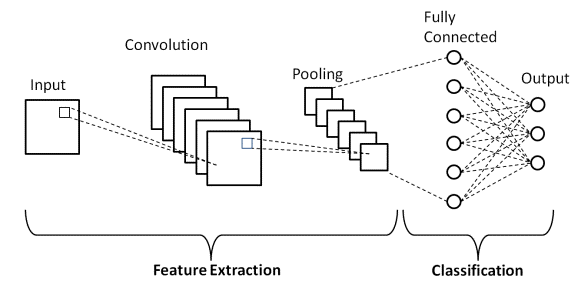

In [99]:
# Defining the CNN model
def Skin_Lesion_Model(dropout):
  # The simplest model is defined in the Sequential class which is a linear stack of Layers
  model = Sequential()
  # preprocessing layer which rescales input values to a new range.
  model.add(layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_size, img_size, 3)))
  # creating a convolution kernel that is convolved with the layer input to produce a tensor of outputs i.e. first layer (convolutional)
  model.add(Conv2D(16, kernel_size = (3,3), input_shape = (img_size, img_size, 3), activation = 'relu', padding = 'same'))
  model.add(Conv2D(32, kernel_size = (3,3), activation = 'relu'))

# A pooling layer is added after the convolutional layer. 
# The pooling layer operates upon each feature map separately to create a new set of the same number of pooled feature maps.
# Pooling involves selecting a pooling operation, much like a filter to be applied to feature maps. 
# The size of the pooling operation or filter is smaller than the size of the feature map;
# This means that the pooling layer will always reduce the size of each feature map by a factor of 2, 
# e.g. each dimension is halved, reducing the number of pixels or values in each feature map to one quarter the size. 

  # Adding a Pooling layer i.e. Max pooling operation for 2D spatial data (second layer i.e. pooling)
  model.add(MaxPool2D(pool_size = (2,2)))

  model.add(Conv2D(32, kernel_size = (3,3), activation = 'relu', padding = 'same'))
  model.add(Conv2D(64, kernel_size = (3,3), activation = 'relu'))
  model.add(MaxPool2D(pool_size = (2,2), padding = 'same'))

  # Adding the dropout layer to reduce overfitting
  model.add(Dropout(dropout))

  model.add(Conv2D(64, kernel_size = (3,3), activation = 'relu'))
  model.add(Conv2D(64, kernel_size = (3,3), activation = 'relu', padding = 'same'))
  model.add(MaxPool2D(pool_size = (2,2), padding = 'same'))

  # input is now flattened, batch size is not affected i.e. fully connected layer
  model.add(Flatten())

  # adding activation functions
  # Here, the layer type used is Dense which is fully connected layer 
  # Here, the activation argument is set to relu, which applies the rectified linear unit activation function
  model.add(Dense(64, activation = 'relu'))
  model.add(Dense(64, activation='relu'))
  model.add(Dense(32, activation='relu'))
  model.add(Dense(32, activation='relu'))
  # Here, the activation argument is set to softmax, which converts a vector of values to a probability distribution. The elements of the output vector are in range (0, 1) and sum to 1.
  model.add(Dense(7, activation='softmax'))
  return model


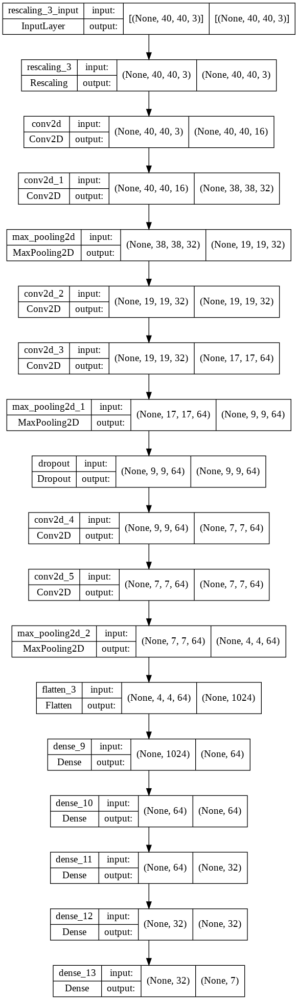

In [100]:
# Displaying the 5 layer CNN architecture
tf.keras.utils.plot_model(Skin_Lesion_Model(0.3), to_file="./net.png", show_shapes=True)

In [101]:
# Creating the CNN model

# Dropout is a regularization method that approximates training a large number of neural networks with different architectures in parallel.
# It is a simple way to prevent Neural Networks from Overfitting. 
# In this case, nodes to be dropped-out are randomly selected with 30% probability each weight update cycle

# lr stands for learning rate. 
# The learning rate is a hyperparameter that controls how much to change the model in response to the estimated error each time the model weights are updated. 
# Choosing the learning rate is challenging as a value too small may result in a long training process that could get stuck, 
# whereas a value too large may result in learning a sub-optimal set of weights too fast or an unstable training process.

def create_cnn_model(dropout=0.3, lr=2e-2, train_batch_size = 16):
  model = Skin_Lesion_Model(dropout,)
  
# Optimizers are algorithms or methods used to change the attributes of the neural network such as weights and learning rate to reduce the losses. 
# They are used to solve optimization problems by minimizing the function.

# The purpose of loss functions is to compute the quantity that a model should seek to minimize during training.
# Here, we are using the probabilistic loss SparseCategoricalCrossentropy

  # instantiating the optimizer optimizer and loss
  model.compile(
        tf.keras.optimizers.Adam( learning_rate=lr),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy']
        )
  
  # model callbacks
  metrics_callback = MetricsCallback(test_data=X_val, y_true=Y_val)
  
# Early Stopping: One way to avoid overfitting of data is to terminate the process early. 
# The EarlyStoppingfunction has various metrics/arguments that you can modify to set up when the training process should stop.

# Checkpoint: This callback saves the model after every epoch.

  # defining early stopping and checkpoint callbacks
  callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', # value being monitored, i.e: val_loss
                                min_delta=5e-2, # minimum change in the monitored value; training process will be stopped if the absolute change of the monitored value is less than min_delta
                                patience=3, # number of epochs with no improvement after which training will be stopped
                                verbose=1, # Verbosity mode, 0 or 1. Mode 0 is silent, and mode 1 displays messages when the callback takes an action
                                mode='min', # implying to minimize the loss
                                baseline=None, # Training will stop if the model doesn't show improvement over the baseline
                                restore_best_weights=True), # keep the best weights once stopped
               
             tf.keras.callbacks.ModelCheckpoint("/gdrive/MyDrive/ADS/Project/", # saving the model to this path after every epoch      
                                     monitor='val_loss', 
                                     verbose=1, 
                                     save_best_only=True, # set to True to not overwrite the latest best model
                                     save_weights_only=False, # if True, then only the model's weights will be saved, else the full model is saved
                                     mode='auto', 
                                     save_freq='epoch'), # callback saves the model after each epoch
             metrics_callback
             ]

  return model, callbacks


##### Class Weights

It is highly possible that the distribution of discrete values will be very different. Due to this difference in each class, the algorithms tend to get biased towards the majority values present and don’t perform well on the minority values. This difference in class frequencies affects the overall predictability of the model. In order to avoid this problem we adopt a class weight strategy.

In [102]:
# Defining method for computing class weights
def compute_class_weights(Y_train):
  weights = np.full(num_classes, len(Y_train))
  weights = dict(enumerate(weights))
  for w in weights:
    weights[w] = weights[w] / (num_classes * Counter(Y_train)[w] ) 
  return weights

In [103]:
# CNN model fitting
def cnn_experiment(X_train, Y_train, X_val, Y_val, dropout=0.3, lr=2e-2, train_batch_size = 16):
  model, callbacks = create_cnn_model(dropout, lr, train_batch_size)
  epochs=10 # number of epochs
  history = model.fit(
    X_train,
    Y_train,
    validation_data=(X_val, Y_val),
    epochs=epochs,
    callbacks=callbacks,
    batch_size=batch_size_train,
    shuffle=True,
    class_weight = compute_class_weights(Y_train)
  )
  return history, callbacks

In [104]:
# CNN hyperparameter tuning
def hyp_tuning(datasets, hyperparams):
  results = {}
  for d in datasets:
    data = datasets[d]
    for hyp in hyperparams:
      h, c = cnn_experiment(X_train=data[0],Y_train=data[1],X_val=data[2], Y_val=data[3], 
                            dropout=hyp["dropout"], 
                            lr=hyp["lr"], 
                            train_batch_size=hyp["train_batch_size"], 
                           )
      # identifying the best epoch as the one with minimum val_loss
      best_epoch = np.argmin(h.history["val_loss"])
      # adding to results
      results[f"{d}_{hyp}"] = (h, c[-1].results[best_epoch], best_epoch)
  return results

In [105]:
# Defining CNN hyperparameters
cnn_params = [
        {"dropout":0.3, "lr":1e-3, "train_batch_size":128, },
        {"dropout":0.4, "lr":2e-3, "train_batch_size":64, },
        {"dropout":0.4, "lr":3e-2, "train_batch_size":128},

]
# Creating original train, augmented train, undersampled train, and combined train datasets
datasets = {
    "original": (X_train, Y_train, X_val, Y_val),
    "original_augmented": (np.array(augmented_train_data), Y_train, X_val, Y_val),
    "undersampled":(np.array(augmented_train_data_undersampled), Y_train_undersampled, X_val, Y_val), 
    "combined":(np.array(augmented_train_data_combined), Y_train_combined, X_val, Y_val)
    }
    
# Hyperparameter tuning on original train, augmented train, undersampled train, and combined train datasets
cnn_results = hyp_tuning(datasets=datasets, hyperparams=cnn_params)


Epoch 1/10
197/198 [============================>.] - ETA: 0s - loss: 1.9484 - accuracy: 0.2559
Epoch 1: val_loss improved from inf to 1.95414, saving model to /gdrive/MyDrive/ADS/Project/
INFO:tensorflow:Assets written to: /gdrive/MyDrive/ADS/Project/assets
Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        85
           1       0.00      0.00      0.00       460
           2       0.00      0.00      0.00        11
           3       0.00      0.00      0.00        82
           4       0.00      0.00      0.00         6
           5       0.04      1.00      0.08        30
           6       0.00      0.00      0.00        27

    accuracy                           0.04       701
   macro avg       0.01      0.14      0.01       701
weighted avg       0.00      0.04      0.00       701

198/198 [==============================] - 37s 181ms/step - loss: 1.9484 - accuracy: 0.2557 - val_loss: 1.9541 - val_accur

In [106]:
# Method for storing the CNN results in a cleaner specified format
def format_results(res):
  exp = pd.DataFrame()
  models = []
  accuracies = []
  precisions = []
  recalls = []
  f1s = []

  for r in res:
    models.append(r)
    df = pd.DataFrame(res[r][1])
    # Calculating evaluation metrics
    accuracies.append(df["accuracy"].values[0])
    precisions.append(df["macro avg"].values[0])
    recalls.append(df["macro avg"].values[1])
    f1s.append(df["macro avg"].values[2])
  # Appending these metrics to results dataframe    
  exp["model"] = models
  exp["accuracy"] = accuracies
  exp["precision"] = precisions
  exp["recall"] = recalls
  exp["f1"] = f1s

  return exp

# Storing CNN results in a specific format for ease of understanding 
cnn_presults = format_results(cnn_results)

In [107]:
# Storing CNN hyperparameter tuning results in the specified format to csv
cnn_presults.to_csv("/gdrive/MyDrive/ADS/Project/CNN_hyperparameterization.csv")

In [108]:
cnn_presults

,model,accuracy,precision,recall,f1
0,"original_{'dropout': 0.3, 'lr': 0.001, 'train_...",0.042796,0.006114,0.142857,0.011726
1,"original_{'dropout': 0.4, 'lr': 0.002, 'train_...",0.015692,0.002242,0.142857,0.004414
2,"original_{'dropout': 0.4, 'lr': 0.03, 'train_b...",0.656205,0.093744,0.142857,0.113203
3,"original_augmented_{'dropout': 0.3, 'lr': 0.00...",0.503566,0.194150,0.246668,0.162766
4,"original_augmented_{'dropout': 0.4, 'lr': 0.00...",0.656205,0.093744,0.142857,0.113203
5,"original_augmented_{'dropout': 0.4, 'lr': 0.03...",0.116976,0.016711,0.142857,0.029922
6,"undersampled_{'dropout': 0.3, 'lr': 0.001, 'tr...",0.559201,0.170898,0.274586,0.168786
7,"undersampled_{'dropout': 0.4, 'lr': 0.002, 'tr...",0.042796,0.006114,0.142857,0.011726
8,"undersampled_{'dropout': 0.4, 'lr': 0.03, 'tra...",0.656205,0.093744,0.142857,0.113203
9,"combined_{'dropout': 0.3, 'lr': 0.001, 'train_...",0.570613,0.384271,0.531524,0.405655


Text(0, 0.5, 'loss')

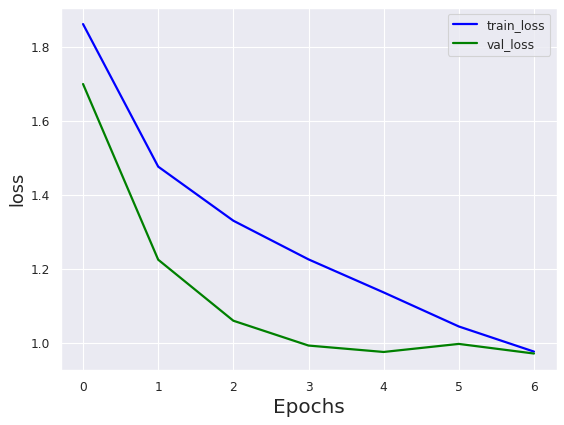

In [109]:
# Plotting epochs vs training data loss and validation data loss
from matplotlib.pyplot import figure
%matplotlib inline
best = cnn_presults.sort_values("f1", ascending=False).values[0]
figure(figsize=(8, 6), dpi=80)
history = cnn_results[str(best[0])][0]
plt.plot(history.epoch, history.history["loss"], color='blue',linewidth=2, markersize=12, label="train_loss")
plt.plot(history.epoch, history.history["val_loss"], color='green',linewidth=2, markersize=12,  label="val_loss")
plt.legend()
plt.xlabel('Epochs', fontsize=18)
plt.ylabel('loss', fontsize=16)

In [110]:
# Displaying results classification report
val_results = pd.DataFrame(cnn_results[str(best[0])][1]).transpose()
val_results

,precision,recall,f1-score,support
0,0.419355,0.305882,0.353741,85.000000
1,0.923323,0.628261,0.747736,460.000000
2,0.106383,0.454545,0.172414,11.000000
3,0.264550,0.609756,0.369004,82.000000
4,0.294118,0.833333,0.434783,6.000000
5,0.333333,0.333333,0.333333,30.000000
6,0.348837,0.555556,0.428571,27.000000
accuracy,0.570613,0.570613,0.570613,0.570613
macro avg,0.384271,0.531524,0.405655,701.000000
weighted avg,0.719572,0.570613,0.613925,701.000000


In [111]:
# Finding the best epoch 
best_epoch = cnn_results[str(best[0])][2]
print('Best epoch value =',best_epoch)

Best epoch value = 6


In [112]:
# displaying the CNN hyperparameters for the best epoch instance
dataset_name = best[0].split("_")[0]
best_data = datasets[dataset_name]
best_conf = cnn_params[cnn_params.index(ast.literal_eval(best[0].split(dataset_name+"_")[1]))]
best_conf

{'dropout': 0.3, 'lr': 0.001, 'train_batch_size': 128}

In [113]:
# Creating CNN model with the best epoch hyperparameters
best_model, callbacks = create_cnn_model(best_conf["dropout"], best_conf["lr"], best_conf["train_batch_size"])

In [114]:
# Retrain best model
epochs = 10
history = best_model.fit(
  np.array(augmented_train_data_combined),
  Y_train_combined,
  validation_data=(X_val, Y_val),
  epochs=epochs,
  callbacks=callbacks,
  batch_size=batch_size_train,
  shuffle=True,
  class_weight=compute_class_weights(Y_train_combined)
)

Epoch 1/10
547/547 [==============================] - ETA: 0s - loss: 1.8596 - accuracy: 0.1920
Epoch 1: val_loss improved from inf to 1.67574, saving model to /gdrive/MyDrive/ADS/Project/
INFO:tensorflow:Assets written to: /gdrive/MyDrive/ADS/Project/assets
Classification Report
              precision    recall  f1-score   support

           0       0.16      0.08      0.11        85
           1       0.89      0.23      0.37       460
           2       0.05      0.73      0.10        11
           3       0.22      0.38      0.28        82
           4       0.02      0.67      0.04         6
           5       0.13      0.07      0.09        30
           6       0.00      0.00      0.00        27

    accuracy                           0.23       701
   macro avg       0.21      0.31      0.14       701
weighted avg       0.64      0.23      0.29       701

547/547 [==============================] - 99s 180ms/step - loss: 1.8596 - accuracy: 0.1920 - val_loss: 1.6757 - val_accur

In [115]:
# test evaluation
preds = np.argmax(best_model.predict(X_test), axis=1)
f1_score(preds, Y_test, average="macro")

0.4459269838415976

In [116]:
test_results = pd.DataFrame()
# Calculating evaluation metrics
test_results["accuracy"] = [accuracy_score(preds, Y_test)]
test_results["precision"] = [precision_score(preds, Y_test, average="macro")]
test_results["recall"] = [recall_score(preds, Y_test, average="macro")]
test_results["f1"] = [f1_score(preds, Y_test, average="macro")]
test_results["balanced_multiclass_accuracy"] = [balanced_accuracy_score(preds, Y_test)]
# Storing the CNN results in csv
test_results.to_csv("/gdrive/My Drive/ADS/Project/cnn_test_results.csv")
test_results

,accuracy,precision,recall,f1,balanced_multiclass_accuracy
0,0.587354,0.590046,0.424173,0.445927,0.424173


In [117]:
# Printing classification report for CNN
print('Classification report for CNN')
print(classification_report(preds, Y_test))

Classification report for CNN
              precision    recall  f1-score   support

           0       0.28      0.41      0.33       217
           1       0.62      0.95      0.75      1345
           2       0.73      0.12      0.21       131
           3       0.66      0.27      0.38       865
           4       0.86      0.62      0.72        68
           5       0.47      0.40      0.44       178
           6       0.50      0.20      0.29       201

    accuracy                           0.59      3005
   macro avg       0.59      0.42      0.45      3005
weighted avg       0.60      0.59      0.54      3005



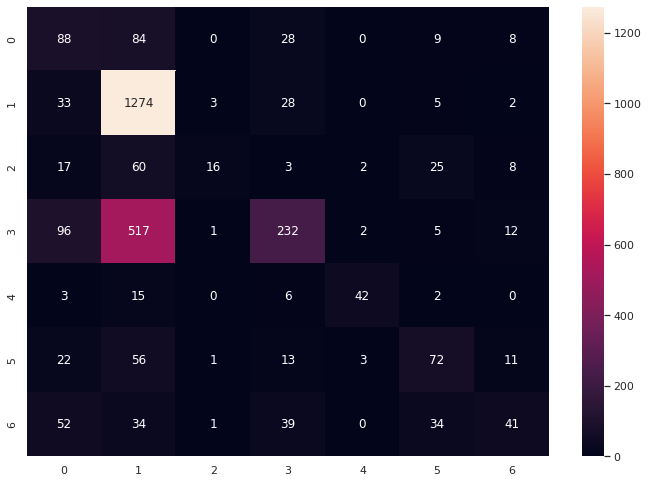

In [118]:
# confusion matrix for CNN
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
cf_matrix = confusion_matrix(preds, Y_test)
sns.heatmap(cf_matrix,  fmt="g", annot=True)

### Ensemble Learning

Ensemble methods is a machine learning technique that combines several base models in order to produce one optimal predictive model. The reason ensemble learning is efficient is because machine learning models work differently. Each model might perform well on some data and less accurately on others. When you combine all them, they cancel out each other’s weaknesses. Ensemble methods can be applied to both predictions problems and classification problems. 

One of the three main classes of ensemble learning methods is Boosting. Boosting involves adding ensemble members sequentially that correct the predictions made by prior models and outputs a weighted average of the predictions. It seeks to change the training data to focus attention on examples that previous fit models on the training dataset have gotten wrong.

Key elements of boosting are as follows:

- Bias training data toward those examples that are hard to predict.
- Iteratively add ensemble members to correct predictions of prior models.
- Combine predictions using a weighted average of models.

### XGBoosting

XGBoost stands for e**X**treme **G**radient **B**oosting. XGBoost is an implementation of gradient boosted decision trees algorithm designed for execution speed and model performance. This algorithm goes by lots of different names such as gradient boosting, multiple additive regression trees, stochastic gradient boosting or gradient boosting machines. XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. XGBoost provides a parallel tree boosting (GBDT) that solve many data science problems in a fast and accurate way. This approach supports both regression and classification predictive modeling problems. 

In [119]:
# Initialising XGBoost to load the XGBClassifier class from xgboost library and define the classifier model
def init_XGB():
  return xgb.XGBClassifier(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1, gamma=0,
                                            learning_rate=0.1, max_delta_step=0,
                                            max_depth=3, min_child_weight=1,
                                            missing=None, n_estimators=100,
                                            n_jobs=-1, nthread=None,
                                            objective='multi:softprob',
                                            random_state=1855, reg_alpha=0,
                                            reg_lambda=1, scale_pos_weight=1,
                                            seed=None, silent=None, subsample=1,
                                            verbosity=0)

In [120]:
# XGBoost model fitting and evaluation
def datasets_eval(model, X_train, X_val, Y_train, Y_val):
  precisions, recalls, f1s, accuracies = [], [], [], []  
  results = pd.DataFrame()
  # fit the train data to XGBoost model
  model.fit(X_train, Y_train)

  # evaluation measures on validation set
  val_preds = model.predict(X_val)
  precisions.append(precision_score(val_preds, Y_val, average="macro"))
  recalls.append(recall_score(val_preds, Y_val, average="macro"))
  f1s.append(f1_score(val_preds, Y_val, average="macro"))
  accuracies.append(accuracy_score(val_preds, Y_val))
  # appending the evaluation measures to results
  results["accuracy"] = accuracies
  results["precision"] = precisions
  results["recall"] = recalls
  results["f1"] = f1s

  return results

In [121]:
# Creating original train, augmented train, undersampled train, and combined train datasets
datasets = {
    "original":(X_train.reshape(-1, img_size*img_size*3), Y_train, X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "original_augmented":(augmented_train_data.reshape(-1, img_size*img_size*3), Y_train,  X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "undersampled":(np.array(augmented_train_data_undersampled).reshape(-1, img_size*img_size*3), Y_train_undersampled, X_val.reshape(-1, img_size*img_size*3), Y_val), 
    "combined":(np.array(augmented_train_data_combined).reshape(-1, img_size*img_size*3), Y_train_combined, X_val.reshape(-1, img_size*img_size*3), Y_val)
    }

results = {}

In [122]:
# printing the length of datasets
for i in datasets:
  print(len(i))

8
18
12
8


In [123]:
# initializing the XGBoost model for all datasets
for d in tqdm(datasets):
  m = init_XGB()
  # calculating the evaluation metrics for all datasets and appending them to results
  r = datasets_eval(m, datasets[d][0], datasets[d][2], datasets[d][1], datasets[d][3])
  results[d] = r

100%|██████████| 4/4 [36:04<00:00, 541.10s/it]


In [124]:
# Saving the XGBoost results to pickle
save_pickle(results, "xgboosting_results")

In [125]:
for r in results:
  # Appending dataset column to results
  results[r]["dataset"] = r
# Concatenating the results of all datasets to a single dataframe
all_models_results = pd.concat([
                                results["original"],
                                results["original_augmented"],
                                results["undersampled"],
                                results["combined"],
                                ])
# Sort and display all dataset results in descending order of F1
best = all_models_results.sort_values("f1", ascending=False).values[0]
all_models_results.sort_values("f1", ascending=False)

,accuracy,precision,recall,f1,dataset
0,0.559201,0.555720,0.358487,0.392808,combined
0,0.734665,0.349677,0.528560,0.379375,original
0,0.711840,0.333531,0.532302,0.363170,undersampled
0,0.703281,0.255249,0.374085,0.275315,original_augmented


In [126]:
# Storing xgboosting validation results to csv
all_models_results.sort_values("f1", ascending=False).to_csv("/gdrive/MyDrive/ADS/Project/xgboost_validation_results.csv")

In [127]:
# best model for XGBoost
best = best[-1]

m = init_XGB()
m.fit(datasets[best][0], datasets[best][1])
preds = m.predict(X_test.reshape(-1, img_size*img_size*3))

In [128]:
test_results = pd.DataFrame()
# Calculating evaluation metrics for XGBoost
test_results["accuracy"] = [accuracy_score(preds, Y_test)]
test_results["precision"] = [precision_score(preds, Y_test, average="macro")]
test_results["recall"] = [recall_score(preds, Y_test, average="macro")]
test_results["f1"] = [f1_score(preds, Y_test, average="macro")]
test_results["balanced_multiclass_accuracy"] = [balanced_accuracy_score(preds, Y_test)]
# Saving XGBoost results to csv
test_results.to_csv("/gdrive/MyDrive/ADS/Project/XGBoost_test_results.csv")
test_results

,accuracy,precision,recall,f1,balanced_multiclass_accuracy
0,0.546423,0.532825,0.338108,0.365409,0.338108


In [129]:
# Printing classification report for XGBoost
print('Classification report for XGBoost')
print(classification_report(preds, Y_test))

Classification report for XGBoost
              precision    recall  f1-score   support

           0       0.34      0.35      0.35       297
           1       0.59      0.94      0.72      1276
           2       0.59      0.08      0.14       164
           3       0.54      0.28      0.37       663
           4       0.73      0.25      0.37       144
           5       0.42      0.28      0.34       226
           6       0.52      0.18      0.27       235

    accuracy                           0.55      3005
   macro avg       0.53      0.34      0.37      3005
weighted avg       0.54      0.55      0.49      3005



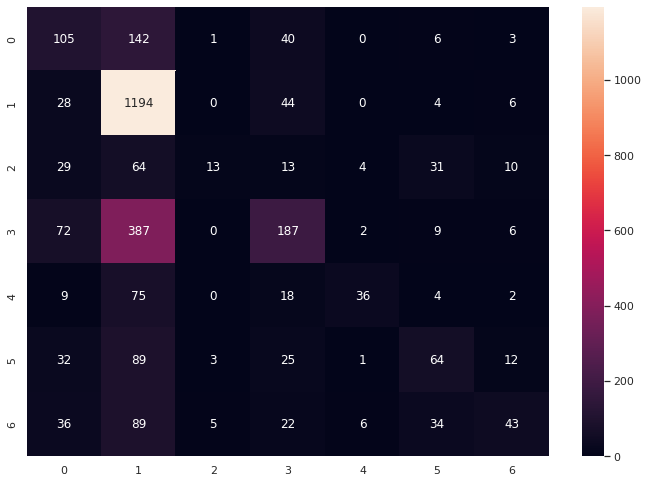

In [130]:
# Confusion Matrix for XGBoost
sns.set(rc={'figure.figsize':(11.7,8.27)})
cf_matrix = confusion_matrix(preds, Y_test)
sns.heatmap(cf_matrix,  fmt="g", annot=True)

### Models Performance and Comparison

We compare all model results at the end of the experiments. 

We take the best model over validation set for each classifier (dataset-hyperparameters) and then we measure all of them over the test set.

We consider two metrics which are useful in multiclass classification for performance comparison:

* **F1-score:** F1-score keeps the balance between precision and recall. It’s often used when class distribution is uneven, but it can also be defined as a statistical measure of the accuracy of an individual test.
  * F1-score is macro-averaged here. This calculates metrics for each class individually and then takes unweighted mean of the measures. This is done as our dataset falls under multiclass classification. This technique gives equal weights to all classes making it a good option for balanced classification tasks.

* **Balanced Multi-Class Accuracy (BMCA):** It is the arithmetic mean of sensitivity and specificity, it's main use case is when dealing with imbalanced data. 
  * **Sensitivity:** This is also known as true positive rate or recall, it measures the proportion of real positives that are correctly predicted out of total positive prediction made by the model.
  * **Specificity:** Also known as true negative rate, it measures the proportion of correctly identified negatives over the total negative prediction made by the model.
  * Balanced Accuracy is useful for multiclass classification. Here, BMCA is the average of Recall obtained on each class, i.e. the macro average of recall scores per class. So, for a balanced dataset, the scores tend to be in the same range as Accuracy.


In [131]:
# Reading the previously generated results files for all ML models

random_classifier_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/random_test_results.csv")
log_reg_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/logistic_regression_test_results.csv")
cnn_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/cnn_test_results.csv")
xgboost_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/XGBoost_test_results.csv")
svm_classifier_results = pd.read_csv("/gdrive/MyDrive/ADS/Project/SVM_test_results.csv")

In [132]:
# Printing the newly read results files

print('Random Classifier Results:')
print(random_classifier_results)
print('Logistic Regression Results:')
print(log_reg_results)
print('SVM Results:')
print(svm_classifier_results)
print('CNN Results:')
print(cnn_results)
print('XGBoost Results:')
print(xgboost_results)
#print('Logistic Regression Results:')
#print(log_reg_results)

Random Classifier Results:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.139434   0.160858  0.142263  0.096045   

   balanced_multiclass_accuracy  
0                      0.142263  
Logistic Regression Results:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.526123    0.48109  0.309528  0.330309   

   balanced_multiclass_accuracy  
0                      0.309528  
SVM Results:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.678869   0.142857  0.096981  0.115532   

   balanced_multiclass_accuracy  
0                      0.678869  
CNN Results:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.587354   0.590046  0.424173  0.445927   

   balanced_multiclass_accuracy  
0                      0.424173  
XGBoost Results:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.546423   0.532825  0.338108  0.365409   

   balanced_multiclass_accuracy  
0         

In [133]:
# Creating a new dataframe for model comparison

model_comparison_df = pd.DataFrame()
model_comparison_df = pd.concat([random_classifier_results, log_reg_results, svm_classifier_results, cnn_results, xgboost_results])
model_comparison_df['model'] = ['Random Classifier', 'Logistic Regression', 'SVM', 'CNN', 'XGBoost']
print('Model Comparison dataframe:')
print(model_comparison_df)

Model Comparison dataframe:
   Unnamed: 0  accuracy  precision    recall        f1  \
0           0  0.139434   0.160858  0.142263  0.096045   
0           0  0.526123   0.481090  0.309528  0.330309   
0           0  0.678869   0.142857  0.096981  0.115532   
0           0  0.587354   0.590046  0.424173  0.445927   
0           0  0.546423   0.532825  0.338108  0.365409   

   balanced_multiclass_accuracy                model  
0                      0.142263    Random Classifier  
0                      0.309528  Logistic Regression  
0                      0.678869                  SVM  
0                      0.424173                  CNN  
0                      0.338108              XGBoost  


#### Models Performance Comparison wrt F1-score (macro)

Text(0.5, 1.0, 'Models Performance wrt F1')

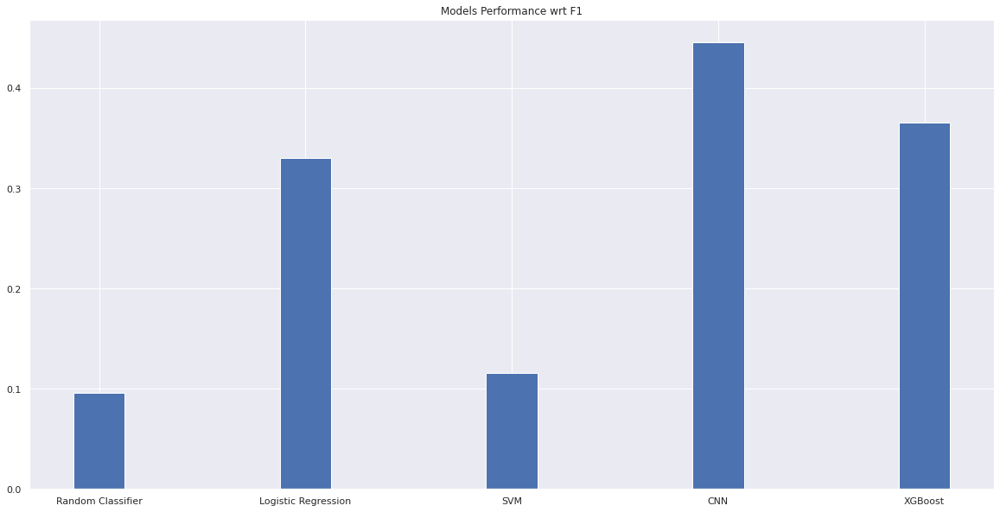

In [134]:
# Visualizing the models comparison wrt F1
%matplotlib inline
plt.figure(figsize = (20,10))
plt.bar(model_comparison_df['model'], model_comparison_df['f1'], width = 0.25)
plt.title("Models Performance wrt F1")

#### Models Performance Comparison wrt BMCA

<BarContainer object of 5 artists>

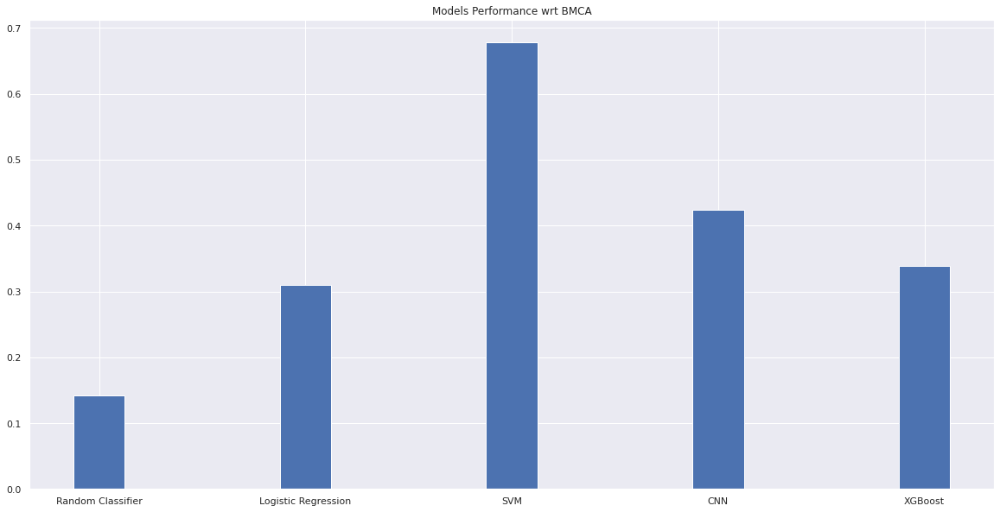

In [135]:
# Visualizing the models comparison wrt BMCA
%matplotlib inline
plt.figure(figsize = (20,10))
plt.title("Models Performance wrt BMCA")
plt.bar(model_comparison_df['model'], model_comparison_df['balanced_multiclass_accuracy'], width = 0.25)

#### ML Models Performance Comparison for F1 vs BMCA

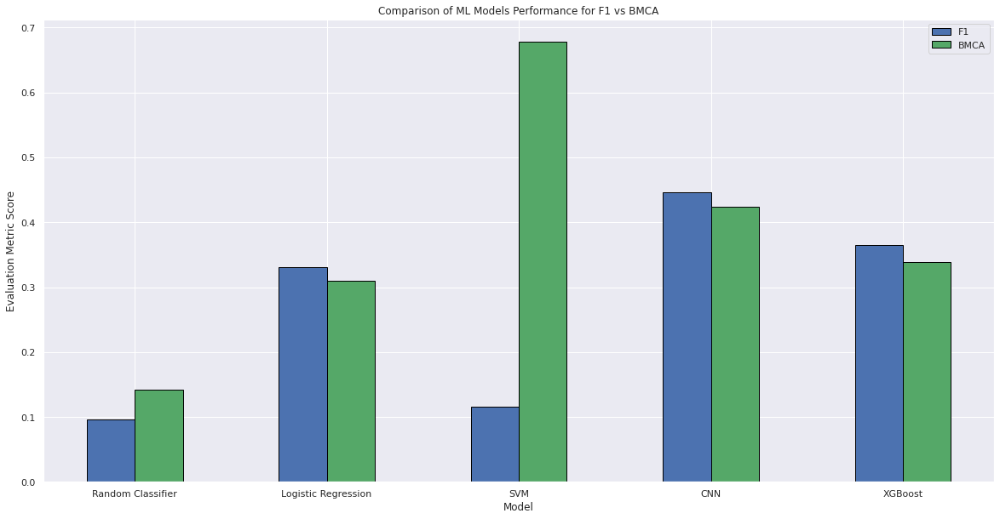

In [136]:
# ML Models Performance Comparison for F1 vs BMCA
plt.figure(figsize = (20,10))  
n=5
r = np.arange(n)
width = 0.25
plt.bar(r, model_comparison_df['f1'].iloc[:], color = 'b',
        width = width, edgecolor = 'black',
        label='F1')
plt.bar(r + width, model_comparison_df['balanced_multiclass_accuracy'].iloc[:], color = 'g',
        width = width, edgecolor = 'black',
        label='BMCA')
  
plt.xlabel("Model")
plt.ylabel("Evaluation Metric Score")
plt.title("Comparison of ML Models Performance for F1 vs BMCA")
  
# plt.grid(linestyle='--')
plt.xticks(r + width/2,['Random Classifier','Logistic Regression','SVM','CNN', 'XGBoost'])
plt.legend()
  
plt.show()

The performance comparison results can be seen in the figures above. We can see that the CNN model achieved the best macro-f1 over the test set (same over validation set) and SVM model achieved the best BMCA score. 

The final results confirms that CNNs perform the best in image classification tasks but also the good performances of boosting techniques (XGBoosting).

The final results also prove that our classification models perform better than our baseline model i.e. random guess classifier. 

### Conclusion

This study's main aim and purpose is to identify the disease classification based on the dermatoscopic images of skin lesions, acquired with a variety of dermatoscope types from a historic sample of patients presented for skin cancer screening, while taking into consideration several patient attributes and data such as age, sex, skin lesion localization, and skin lesion confirmation/detection method. We experimented with various machine learning and deep learning models and methods. The Convolutional Neural Network (CNN) model is the best performing model we deduced of all the models we have implemented in terms of macro F1-score; and the Support Vector Machine (SVM) model is the best performing model in terms of BMCA score. This is a fascinating opportunity for healthcare industry to assess these factors related to patients and their skin lesions, and this analysis is highly important for both healthcare providers and patients. With this knowledge, groundbreaking work can be performed towards early detection of skin cancer in patients, which leads to early treatment procedures and eventual increase in the survival rate of the patients. 